# The Iris Dataset

An straighforward ML exercise.

## 1. Loading Modules

### Basic

In [1]:
import numpy as np
import inspect
import os.path

from math import pi

# from scipy import stats
# from scipy.interpolate import interp1d
# from scipy.optimize import curve_fit, brentq
# from scipy.integrate import quad, simps

### Data Handling and Cleaning

In [2]:
import pandas as pd

# import datetime as dt
# import charset_normalizer
# import fuzzywuzzy as fwz

### Data Visualization and Analysis

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

from dataprep.eda import create_report

In [4]:
%matplotlib inline

In [5]:
sns.set_style("whitegrid")

In [6]:
# plt.rcParams['font.family'] = 'Times New Roman'
# plt.rcParams['mathtext.fontset'] = 'stix'#['dejavusans', 'dejavuserif', 'cm', 'stix', 'stixsans', 'custom']
# font = {'family': 'Times New Roman',
#         #'color':  'black',
#         'weight': 'normal',
#         'size': 14,
#         }

# aesthetic definitions for the plots
# font = {'size'   : 16, 'family':'STIXGeneral'}
# axislabelfontsize='large'
# matplotlib.rc('font', **font)
# matplotlib.mathtext.rcParams['legend.fontsize']='medium'
# plt.rcParams["figure.figsize"] = [8.0,6.0]

# %config InlineBackend.figure_format = "retina"
# plt.rcParams['figure.figsize'] = (13, 8)
# plt.rcParams['font.family'] = 'STIXGeneral'
# matplotlib.mathtext.rcParams['legend.fontsize']='medium'
# plt.rcParams['font.serif'] = ['New Times Roman']
# plt.rc('text', usetex=True)

### Machine Learning Explainability

In [7]:
# import graphviz
import shap
# import eli5

from sklearn import tree
from sklearn.tree import plot_tree
from xgboost import plot_tree as xgb_tree

from sklearn.inspection import permutation_importance

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(


## 2. Loading data 

We will prepare the dataset

In [8]:
# sklearn already has the iris dataset
from sklearn.datasets import load_iris

In [9]:
# defining path to data file
file_path = "./data/iris_dataset.csv"

# checking if dataset exists
data_exists = os.path.exists(file_path)
print(data_exists)

True


In [10]:
# defining the dataset: raw_data

if data_exists:
    raw_data = pd.read_csv(file_path, index_col=0)

else:
    # loading the data as a pandas DataFrame
    sk_data = load_iris(as_frame=True)

    # the data is split into the actual physical data of the flowers (features), the species in code (target), and the species names
    print(sk_data['data'])
    print(sk_data['target'])
    print(sk_data['target_names'])

    # we define a new DataFrame that has all the information we need:
    raw_data = sk_data['data'].copy()
    raw_data['species'] = sk_data['target'].apply(lambda species_code: sk_data['target_names'][species_code])

    # saving the dataset to the folder
    raw_data.to_csv(file_path)

In [11]:
raw_data

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [12]:
# copying the original data so we can manipulate it
data = raw_data.copy()

## 3. Data Cleaning

It's a bit hard to manipulate the data with these names. Let us clean them up!

In [13]:
def new_name(col_name):
    
    words = col_name.split(' ') # split along spaces
    if len(words) > 1:
        new_col_name = words[0] + '_' + words[1] # new name
    else:
        new_col_name = col_name

    return new_col_name

In [14]:
new_names = {col:new_name(col) for col in data.columns}
print(new_names)

{'sepal length (cm)': 'sepal_length', 'sepal width (cm)': 'sepal_width', 'petal length (cm)': 'petal_length', 'petal width (cm)': 'petal_width', 'species': 'species'}


In [15]:
data = data.rename(columns = new_names)

## 4. Exploratory Data Analysis

Let us create a report on the dataset

In [17]:
report1 = create_report(data, title='Iris Dataset')
# report1.show_browser()

  0%|                                                                                                         …

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


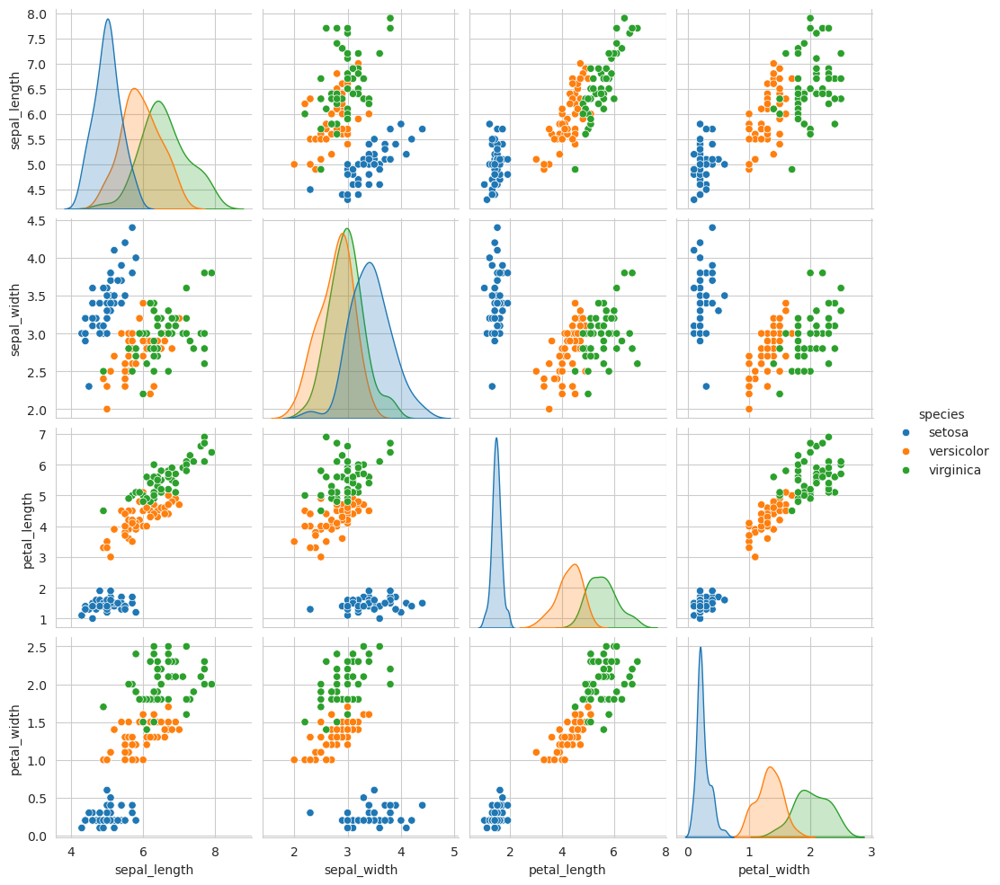

In [18]:
sns.pairplot(data, hue='species')

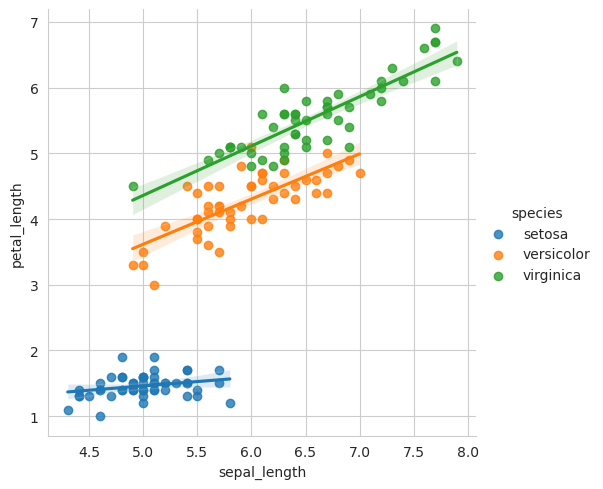

In [19]:
sns.lmplot(data, x='sepal_length', y='petal_length', hue='species')

## 5. Preprocessing

### Importing modules

In [99]:
from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.compose import ColumnTransformer

from sklearn.preprocessing import LabelEncoder, MinMaxScaler, PowerTransformer, StandardScaler
from scipy.stats import boxcox

from sklearn.model_selection import train_test_split, cross_val_score

from sklearn.feature_selection import mutual_info_classif

### Feature Engineering

It may be useful to consider additional features, such as the area of the petals and sepals, and their elongation. We will make a new copy of the data for that.

In [76]:
# function for new features
def new_iris_features(dataset):
    """
    Computes the area and elongation of each part of the irist flower in the iris dataset.
    """

    new_features = {}

    for part in ['sepal', 'petal']:
        new_features[part+'_area'] = dataset[part+'_length']*dataset[part+'_width'] # compute area
        new_features[part+'_elongation'] = dataset[part+'_length']/dataset[part+'_width'] # compute elongation

    return new_features

In [87]:
engineered_data = data.copy() # making copy

# applying the function
for feat, column in new_iris_features(engineered_data).items():
    engineered_data[feat] = column

In [88]:
engineered_data.columns

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'species',
       'sepal_area', 'sepal_elongation', 'petal_area', 'petal_elongation'],
      dtype='object')

In [79]:
report2 = create_report(engineered_data, title='Iris Dataset (new features)')
# report2.show_browser()

  0%|                                                                                                         …

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


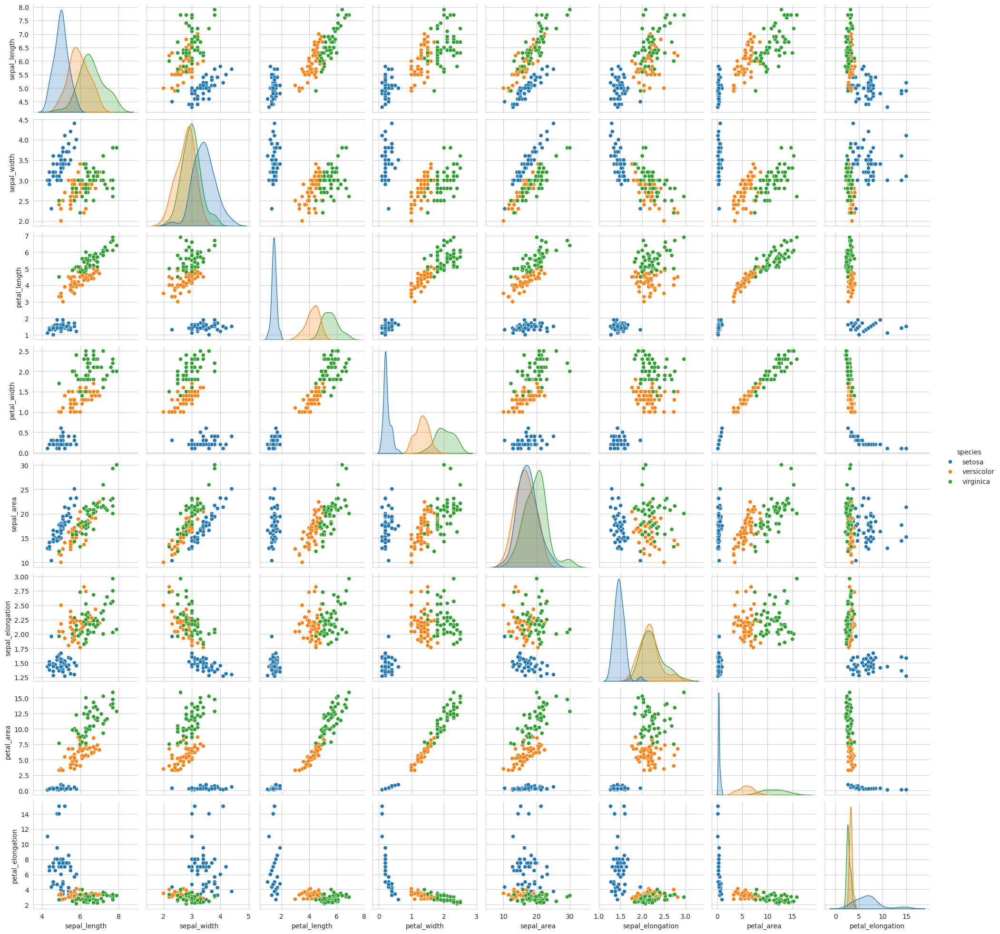

In [80]:
sns.pairplot(engineered_data, hue='species')

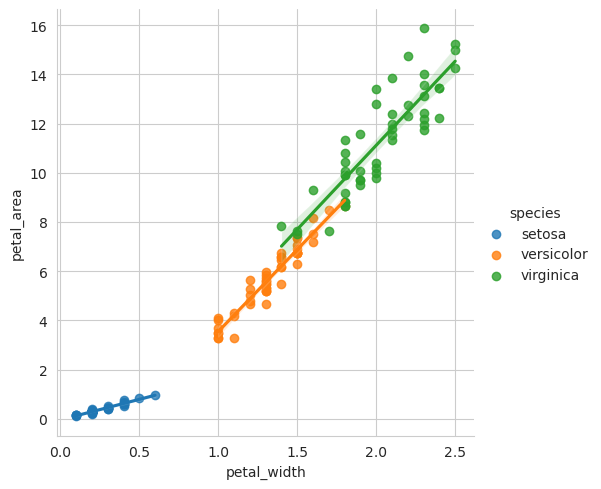

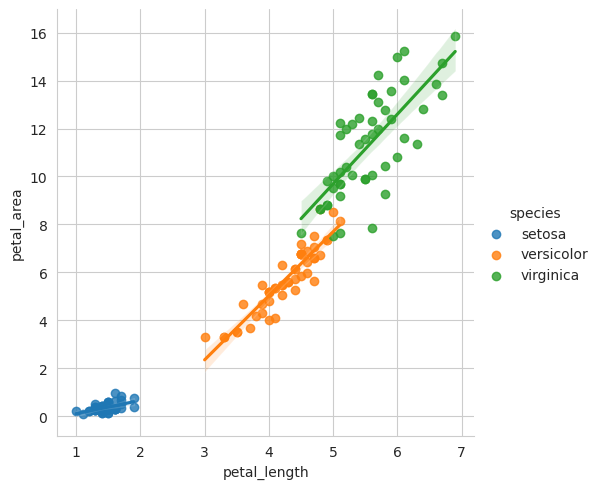

In [81]:
sns.lmplot(engineered_data, x='petal_width', y='petal_area', hue='species')
sns.lmplot(engineered_data, x='petal_length', y='petal_area', hue='species')

Are the new features we devised useful? Let us consider, for example, their mutual information.

In [89]:
data_features = data[[col for col in data.columns if col != 'species']]
data_target = data['species']

dict(zip(data_features.columns, mutual_info_classif(data_features, data_target, random_state=0)))

{'sepal_length': 0.4738732342805525,
 'sepal_width': 0.28607227699171767,
 'petal_length': 0.9895851732491787,
 'petal_width': 0.9749379656705233}

In [90]:
engineered_features = engineered_data[[col for col in engineered_data.columns if col != 'species']]
engineered_target = engineered_data['species']

dict(zip(engineered_features.columns, mutual_info_classif(engineered_features, engineered_target, random_state=0)))

{'sepal_length': 0.4957698739898857,
 'sepal_width': 0.2537621496018658,
 'petal_length': 0.9883409063505002,
 'petal_width': 0.9916575083358325,
 'sepal_area': 0.01639466155817182,
 'sepal_elongation': 0.6212178944673221,
 'petal_area': 1.0396577159969183,
 'petal_elongation': 0.6311536841275238}

So let us define our Feature Engineering class to include in our future pipeline:

In [105]:
class FeatureEngineer(BaseEstimator, TransformerMixin):
    """
    Engineering the new features.
    """
    
    def fit(self, X, y=None): # nothing to do
        return self
    
    def transform(self, X):
        X = X.copy()
        
        new_features = new_iris_features(X) # new features
        
        for feat, col in new_features.items(): # allocating them to the dataset
            X[feat] = col

        return X

### Splitting: Features v. Target

In [106]:
# features vs. target
X = data.select_dtypes(exclude=['object']) # features
y = data['species'] # target

In [107]:
classes = np.unique(y) # finding the unique values of the species, sorted
print("sorted out species/classes:", classes)

sorted out species/classes: ['setosa' 'versicolor' 'virginica']


### Encoding Target data

We begin by label-encoding the targets:

In [108]:
le = LabelEncoder() # defining label encoder

y_encoded = le.fit_transform(y) # fitting and transforming validation data
y_encoded = pd.Series(y_encoded, name='encoded_'+y.name) # turning it into pandas Series 

In [109]:
print("Disagreements between original data and its encoding: ", (le.inverse_transform(y_encoded) != y).any())

Disagreements between original data and its encoding:  False


### Splitting: Training vs. Validation

The data is to be split once, and then used in all models.

In [110]:
# training vs. validation
X_train, X_val, y_train, y_val = train_test_split(X, y_encoded, test_size=0.25, random_state=42)

In [111]:
print("X_train.head():\n"+"."*20+"\n", X_train.head())
print("-"*50)
print("y_train.head():\n"+"."*20+"\n", y_train.head())
print("-"*50)
print("y_train.value_counts():\n"+"."*20+"\n", y_train.value_counts())

X_train.head():
....................
      sepal_length  sepal_width  petal_length  petal_width
4             5.0          3.6           1.4          0.2
32            5.2          4.1           1.5          0.1
142           5.8          2.7           5.1          1.9
85            6.0          3.4           4.5          1.6
86            6.7          3.1           4.7          1.5
--------------------------------------------------
y_train.head():
....................
 4      0
32     0
142    2
85     1
86     1
Name: encoded_species, dtype: int64
--------------------------------------------------
y_train.value_counts():
....................
 1    39
2    38
0    35
Name: encoded_species, dtype: int64


### Scaling

For this model, it's best if we scale the features:

In [112]:
# my_scaler = MinMaxScaler() # defining the scaler: MinMx
boxcox_scaler = PowerTransformer(method='box-cox', standardize=True) # defining the scaler: Box-Cox; note that I use this instead of scipy.stats.boxcox because the latter would require me to rescale the X data before splitting...
z_scaler = StandardScaler()

In [113]:
X_train_scaled = boxcox_scaler.fit_transform(X_train) # fitting and transforming training data
X_train_scaled = z_scaler.fit_transform(X_train_scaled)
X_val_scaled = z_scaler.transform(boxcox_scaler.transform(X_val)) # transforming validation data

Let us then include our scalers into a Column Transformer that will be part of our pipeline. We better make sure we include all columns!

In [114]:
def preprocessor(engineered):
    
    if engineered:
        cols = engineered_features.columns
    else:
        cols = data_features.columns

    preproc = ColumnTransformer(transformers=[
                        ('box-cox', boxcox_scaler, cols),
                        ('z_scaler', z_scaler, cols)])
    
    return preproc

## 6. Pipelines

**TODO:**

1. Include feature-engineering in the preprocessing pipeline
2. Finish evaluation_model function
3. Finish explainer (for all models, including SVC; include trees and equivalents, SHAP, etc)
4. Include Naive Bayes, MLP in models; SVC(probability=True)
5. Evaluate them, explain them, select them!
6. Clean everything up

### Importing Modules

In [120]:
from sklearn.pipeline import Pipeline

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# tree-based
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# need scaling, or at least it doesn't hurt
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier 

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(


### Useful Definitions

We begin by defining a verbosity function:

In [115]:
# verbosity function
def verbosity(verbose, message):
    """
    A function that helps us print a message only when asked.
    """
    if verbose:
        print(message)
    else:
        pass

Now, some important dictionaries that we will fill during model evaluation:

In [116]:
# defining some important dictionaries, whose keys are the models we will study

pipe = {} # dictionary of model pipelines

# for cross-validation (CV):
param_grid = {} # dictionary of model hyperparameter grids

search = {} # dictionary of model CV searches

best_cv = {} # dictionary of model with best CV performance

val_score = {} # dictionary of best model's validation scores

Finally, the score dataframe which we will fill up:

In [117]:
# Create a score dataframe
score = pd.DataFrame(index = ['Precision Train', 'Precision Validation',
                              'Recall Train', 'Recall Validation',
                              'Accuracy Train', 'Accuracy Validation',
                              'F1 Train', 'F1 Validation'])

### Model Evaluation

We will do cross-validation, and also perform some basic hyperparameter optimization. For that, we need to define a function that defines the pipeline, evaluates the model with cross-validation, computes the metrics, spits out some plots (_e.g._, the confussion matrix), and allocates results to a dictionary. Must take a model/pipeline for argument, the hyperparameter grid, and the CV arguments and such. Also flags for if we want plots, SHAP, permutation importance, etc.

In [213]:
def model_evaluation(model, Xytv, avg='macro', perform_cv_randomized=(False,False), scoring='f1_macro', verbose=False, plots=False, random_state=0, **kwargs):
    """
    A function that evaluates a given model. Pass the model name and data, it will read out its pipeline (and param grid, if CV), and perform the model evaluation according to the scoring requested. May also show plots.
    """

    # splitting the datasets
    X_train, X_val, y_train, y_val = Xytv

    # splitting the CV and randomized flags
    perform_cv, randomized = perform_cv_randomized

    # the validation key
    val_key = 'cv' if perform_cv else 'no_cv'

    #-------------------------------------------
    # no cross-validation
    if not perform_cv:
        verbosity(verbose, (":"*70) + f"\nWe will evaluate model={model} with standard validation.\n" + ":"*70)

        # fitting
        verbosity(verbose, "\n -> Fitting the model")
        
        pipe[model].fit(X_train, y_train)
        
        verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Making predictions")
        
        y_pred_train = pipe[model].predict(X_train)
        y_pred_val = pipe[model].predict(X_val)
        
        verbosity(verbose, "......Done!")

    #-------------------------------------------
    # cross-validation
    else:
        verbosity(verbose, f"We will evaluate {model} with cross-validation.")

        # RSKF
        verbosity(verbose, "\n -> Creating instance of `RepeatedStratifiedKFold`")

        sig = inspect.signature(RepeatedStratifiedKFold)
        default_rskf_kwargs = [k for k, v in sig.parameters.items() if v.default is not inspect._empty] # keyword arguments of RepeatedStratifiedKFold
        rskf_kwargs = {k:v for k, v in kwargs.items() if k in default_rskf_kwargs} # picking arguments in kwargs that are meant for RepeatedStratifiedKFold
        rskf = RepeatedStratifiedKFold(random_state=random_state, **rskf_kwargs)
        
        verbosity(verbose, "......Done!")

        # creating the CV search
        verbosity(verbose, " -> Creating the CV search")
        
        # randomized search
        if randomized:
            sig = inspect.signature(RandomizedSearchCV)
            default_cvsearch_kwargs = [k for k, v in sig.parameters.items() if v.default is not inspect._empty] # keyword arguments of RandomizedSearchCV
            cvsearch_kwargs = {k:v for k, v in kwargs.items() if k in default_cv_search_kwargs} # picking arguments in kwargs that are meant for RandomizedSearchCV

            search[model] = RandomizedSearchCV(pipe[model],
                                               param_grid=param_grid[model],
                                               cv=rskf,
                                               scoring=scoring,
                                               n_jobs=-1,
                                               random_state=random_state,
                                               **cvsearch_kwargs)

        # grid search
        else:
            search[model] = GridSearchCV(pipe[model],
                                         param_grid=param_grid[model],
                                         cv=rskf,
                                         scoring=scoring,
                                         n_jobs=-1)

        verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Fitting the model")
        
        search[model].fit(X_train, y_train)
        
        verbosity(verbose, "......Done!")

        # picking the best from CV
        best_cv[model]['pipe'] = search[model].best_estimator_
        best_cv[model]['model'] = best_cv[model]['pipe'].named_steps['model']
        best_cv[model]['score'] = search[model].best_score_
        best_cv[model]['params'] = search[model].best_params_

        if verbose:
            print(" -> CV Results:")
            print(f"best {scoring}: {best_cv[model]['score']}")
            print(f"best params: {best_cv[model]['params']}")
            print("\n")
            print("."*100)
            for score, std, params in zip(search[model].cv_results_['mean_test_score'], search[model].cv_results_['std_test_score'], search[model].cv_results_['params']):
                print(f"mean CV {scoring} score: {score:.4f} +- {std:.4e} --> {params}")
            verbosity(verbose, "......Done!")

        # predictions
        verbosity(verbose, " -> Making predictions")
        
        y_pred_train = best[model]['pipe'].predict(X_train)
        y_pred_val = best[model]['pipe'].predict(X_val)
        
        verbosity(verbose, "......Done!")


    #-------------------------------------------
    # classification report
    verbosity(verbose, " -> Creating Classification Reports")
    
    cr_train = classification_report(y_true=y_train, y_pred=y_pred_train, output_dict=True)
    cr_val = classification_report(y_true=y_val, y_pred=y_pred_val, output_dict=True)
    
    verbosity(verbose, "......Done!")

    # printing classification reports
    if verbose:
        print("\n")
        cr_train2 = pd.DataFrame(cr_train).T
        print("Classification Report: Training\n"+"."*50)
        print(cr_train2.to_markdown())
        print("\n")
        cr_val2 = pd.DataFrame(cr_val).T
        print("Classification Report: Validation\n"+"."*50)
        print(cr_val2.to_markdown())

    #-------------------------------------------
    # computing scores:
    verbosity(verbose, "\n -> Computing Scores")
        
    precision_train = cr_train[avg+' avg']['precision']
    precision_val = cr_val[avg+' avg']['precision']

    recall_train = cr_train[avg+' avg']['recall']
    recall_val = cr_val[avg+' avg']['recall']

    acc_train = accuracy_score(y_true=y_train, y_pred = y_pred_train)
    acc_val = accuracy_score(y_true=y_val, y_pred = y_pred_val)

    F1_train = cr_train[avg+' avg']['f1-score']
    F1_val = cr_val[avg+' avg']['f1-score']

    model_score = [precision_train, precision_val, recall_train, recall_val, acc_train, acc_val, F1_train, F1_val]
        
    verbosity(verbose, "......Done!")

    #-------------------------------------------
    # compare more f1's
    if verbose:
        print("\n"+"*"*50 + "\nDetailed Validation F1 scores:")
        print("."*50)
        for species, f1 in zip(classes, f1_score(y_val, y_pred_val, average=None)):
            print(species+" f1 score:\t", f1) # compute F1 for each class
        print("."*50)
        for method in ['micro', 'macro', 'weighted']:
            print(method+":", f1_score(y_true=y_val, y_pred=y_pred_val, average=method)) # compute F1 for each different kind of average

    #-------------------------------------------
    if plots:
        # calculate confusion matrix
        cm_train = confusion_matrix(y_train, y_pred_train)
        cm_val = confusion_matrix(y_val, y_pred_val)

        fig, ax = plt.subplots(1, 2, figsize=(11,4))

        print("*"*50 + "\nConfusion Matrices:")
        sns.heatmap(cm_train, annot=True, xticklabels=classes, yticklabels=classes, cmap="Reds", fmt='.4g', ax=ax[0])
        ax[0].set_xlabel("Predicted Label")
        ax[0].set_ylabel("True Label")
        ax[0].set_title("Training Confusion Matrix")

        sns.heatmap(cm_val, annot=True, xticklabels=classes, yticklabels=classes, cmap="Greens", fmt='.4g', ax=ax[1])
        ax[1].set_xlabel("Predicted Label")
        ax[1].set_ylabel("True Label")
        ax[1].set_title("Validation Confusion Matrix")

        plt.tight_layout()
        plt.show()

    #-------------------------------------------
    # updating scorecard
    score[model, val_key] = model_score

    #-------------------------------------------
    # returning the model's score

    return model_score 

In [214]:
pipe['dtc'] = DecisionTreeClassifier(random_state=0)

::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
We will evaluate model=dtc with standard validation.
::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

 -> Fitting the model
......Done!
 -> Making predictions
......Done!
 -> Creating Classification Reports
......Done!


Classification Report: Training
..................................................
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |        35 |
| 1            |           1 |        1 |          1 |        39 |
| 2            |           1 |        1 |          1 |        38 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       112 |
| weighted avg |           1 |        1 |          1 |       112 |


Classification Report: Validation
..............................

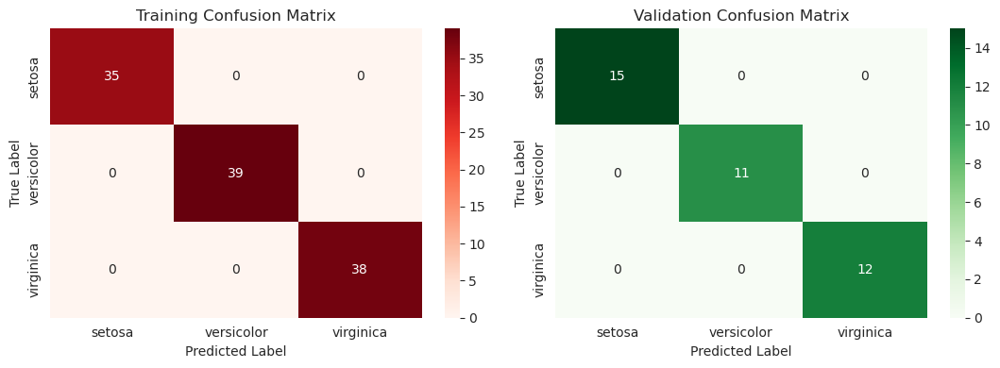

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

In [215]:
model_evaluation('dtc', (X_train, X_val, y_train, y_val), 'macro', verbose=True, plots=True)

### Model Explanation

Signature: any(iterable, /)
Docstring:
Return True if bool(x) is True for any x in the iterable.

If the iterable is empty, return False.
Type:      builtin_function_or_method

In [264]:
def explain(modelname_trainedmodel, Xyval, estimator=0, random_state=0):
    """
    """

    name, model = modelname_trainedmodel

    X_val, y_val = Xyval

    # Permutation Importance
    print("*"*100 + "Performing Permutation Importance:")

    perm_import = permutation_importance(model, X_val, y_val, random_state=random_state)
    feat_import = zip(X_val.columns, perm_import['importances_mean'], perm_import['importances_std'])
    print("The important features are:")
    for feat, mean, std in feat_import:
        if mean > 0:
            print(feat+":", mean, "+-", std)
        else:
            continue

    # preparing for the explanatory plots
    fig1, ax1 = plt.subplots(1, 1, figsize=(11,4))

    tree_model = any([kind in name for kind in ['dtc','rfc', 'xgbc']])
    

    # Tree
    if tree_model:
        print("*"*100 + "\nChecking Tree:")

        # picking tree estimator
        if 'dtc' in name:
            # creating the graph
            model_fig = plot_tree(model,
                                  feature_names=X_val.columns, class_names=classes,
                                  rounded=True, filled=True,
                                  ax=ax1[0])
        elif 'rfc' in name:
            model_fig = plot_tree(model.estimators_[estimator],
                                  feature_names=X_val.columns, class_names=classes,
                                  rounded=True, filled=True,
                                  ax=ax1[0])
        else:
            model_fig = xgb_tree(model, num_trees=estimator, ax=ax1[0])

        
        ax1[0].axis('off')
        ax1[0].set_title(f"Tree for {name}")

    plt.tight_layout()
    plt.show()

    # SHAP
    fig2, ax2 = plt.subplots(1, len(classes), figsize=(11,4))
    
    if tree_model:
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X_val)
    elif 'logreg' in name:
        explainer = shap.LinearExplainer(model, X_train)
        shap_values = explainer.shap_values(X_val)
    else:
        explainer = shap.KernelExplainer(model, X_train)
        shap_values = explainer.shap_values(X_val)

    shap_fig = [shap.summary_plot(shap_values[:,:,i], X_val, title=classes[i], ax=ax2[i]) for i in range(len(classes))]

    for i in range(len(classes)):
        ax2[i].set_title(f"SHAP values for {classes[i]}")

    plt.tight_layout()
    plt.show()

    pass

****************************************************************************************************Performing Permutation Importance:
The important features are:
petal_width: 0.4526315789473685 +- 0.0787717344583988
sepal_area: 0.01578947368421051 +- 0.012892051277806186
petal_area: 0.3052631578947368 +- 0.012892051277806186
****************************************************************************************************
Checking Tree:


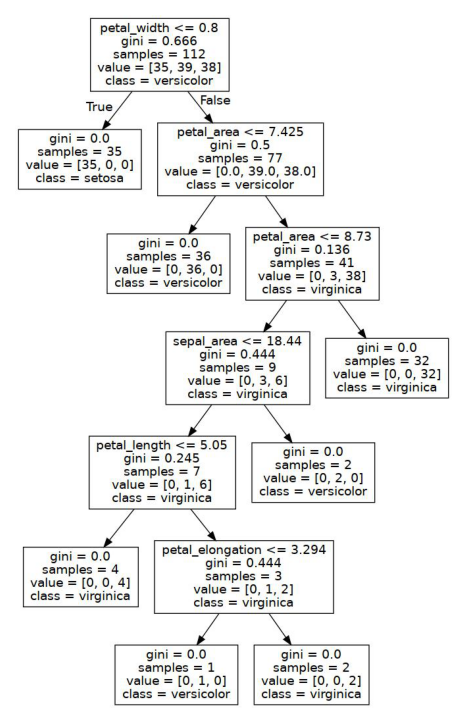

In [265]:
explain(('dtc', pipe['dtc']), (X_val, y_val))

#### Model 1: `DecisionTreeClassifier`

In [282]:
model = 'dtc'

Pipeline:

In [283]:
# defining the pipeline
pipe[model] = Pipeline(steps=[('model', DecisionTreeClassifier(random_state=0))])

Hyperparameters to optimize:

In [284]:
# defining the hyperparameter grid
param_grid[model] = {
    'model__max_leaf_nodes': [None] + list(range(2, 11)),
    'model__max_depth': [None] + list(range(1,11))
    }

Grid:

In [285]:
# putting everything together
grid[model] = GridSearchCV(pipe[model],
                    param_grid=param_grid[model],
                    scoring='f1_macro',
                    cv=5,
                    n_jobs=-1)# 

Fitting the grid-pipeline to the data:

In [286]:
grid[model].fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('model',
                                        DecisionTreeClassifier(random_state=0))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [None, 1, 2, 3, 4, 5, 6, 7, 8, 9,
                                              10],
                         'model__max_leaf_nodes': [None, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10]},
             scoring='f1_macro')

In [287]:
print(model, "results:\n","."*100)
for score, std, params in zip(grid[model].cv_results_['mean_test_score'], grid[model].cv_results_['std_test_score'], grid[model].cv_results_['params']):
    print(f"mean CV f1-macro score: {score:.4f} +- {std:.4e} -> {params}")

dtc results:
 ....................................................................................................
mean CV f1-macro score: 0.9417 +- 1.9212e-02 -> {'model__max_depth': None, 'model__max_leaf_nodes': None}
mean CV f1-macro score: 0.5616 +- 1.1891e-02 -> {'model__max_depth': None, 'model__max_leaf_nodes': 2}
mean CV f1-macro score: 0.9253 +- 2.8839e-02 -> {'model__max_depth': None, 'model__max_leaf_nodes': 3}
mean CV f1-macro score: 0.9253 +- 2.8839e-02 -> {'model__max_depth': None, 'model__max_leaf_nodes': 4}
mean CV f1-macro score: 0.9501 +- 3.0406e-02 -> {'model__max_depth': None, 'model__max_leaf_nodes': 5}
mean CV f1-macro score: 0.9417 +- 1.9212e-02 -> {'model__max_depth': None, 'model__max_leaf_nodes': 6}
mean CV f1-macro score: 0.9417 +- 1.9212e-02 -> {'model__max_depth': None, 'model__max_leaf_nodes': 7}
mean CV f1-macro score: 0.9417 +- 1.9212e-02 -> {'model__max_depth': None, 'model__max_leaf_nodes': 8}
mean CV f1-macro score: 0.9417 +- 1.9212e-02 -> {'model__m

Finding the best estimator and its properties:

In [288]:
best['pipe'][model] = grid[model].best_estimator_
best['model'][model] = best['pipe'][model].named_steps['model']
best['score'][model] = grid[model].best_score_
best['params'][model] = grid[model].best_params_

print("best f1-macro:", best['score'][model])
print("best params:", best['params'][model])

best f1-macro: 0.9500731403672582
best params: {'model__max_depth': None, 'model__max_leaf_nodes': 5}


Let us compute the F1 scores on the validation dataset in detail:

In [289]:
y_preds = best['model'][model].predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val, y_preds, average=avg)) # compute F1 for each different kind of average

val_score[model] = f1_score(y_val, y_preds, average='macro')

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [290]:
print(permutation_importance(best['model'][model], X_val, y_val))
feat_import = dict(zip(X_val.columns, permutation_importance(best['model'][model], X_val, y_val, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.        , 0.50666667, 0.02666667,
       0.        , 0.24      , 0.        ]), 'importances_std': array([0.        , 0.        , 0.        , 0.05333333, 0.01333333,
       0.        , 0.04898979, 0.        ]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.6       , 0.46666667, 0.46666667, 0.46666667, 0.53333333],
       [0.03333333, 0.        , 0.03333333, 0.03333333, 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.2       , 0.26666667, 0.26666667, 0.16666667, 0.3       ],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.0,
 'petal_length': 0.0,
 'petal_width': 0.5333333333333333,
 'sepal_area': 0.019999999999999997,
 'sepal_elongation': 0.0,
 'petal_area': 0.21333333333333332,
 'petal_elongation': 0.0}

So only three features are really being used:

In [291]:
{key:val for key, val in feat_import.items() if val > 0}

{'petal_width': 0.5333333333333333,
 'sepal_area': 0.019999999999999997,
 'petal_area': 0.21333333333333332}

Let us look at the Decision Tree of our model:

{'setosa': 50, 'versicolor': 50, 'virginica': 50}
--------------------------------------------------
Best DecisionTreeClassifier:



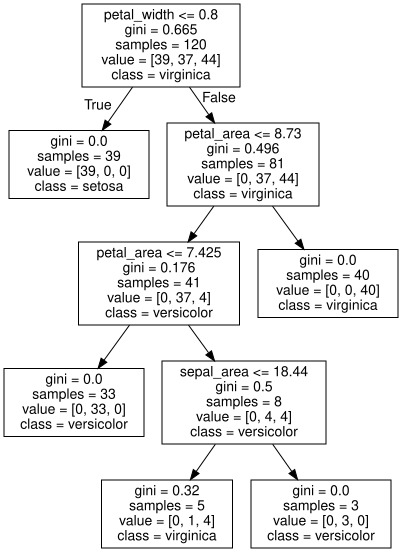

In [292]:
print({species:y.value_counts()[species] for species in classes})
print("-"*50)

tree_graph = tree.export_graphviz(best['model'][model], out_file=None, feature_names=X.columns, class_names=classes)

print("Best DecisionTreeClassifier:\n")
graphviz.Source(tree_graph)

Let us now study the SHAP variables

In [293]:
explainer = shap.TreeExplainer(best['model'][model])
shap_values = explainer.shap_values(X_val)

print(shap_values.shape)

(30, 8, 3)


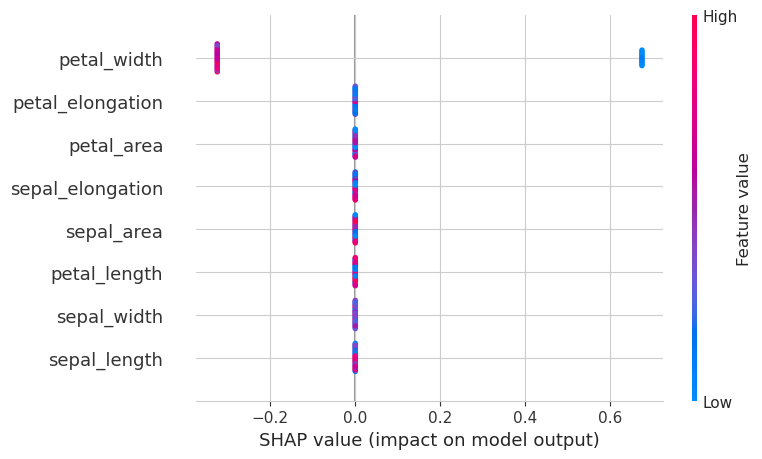

In [294]:
shap.summary_plot(shap_values[:,:,0], X_val, title=classes[0])

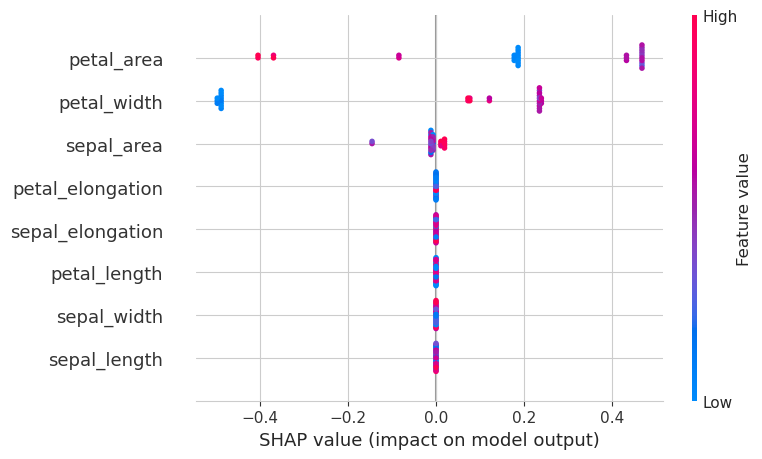

In [295]:
shap.summary_plot(shap_values[:,:,1], X_val, title=classes[1])

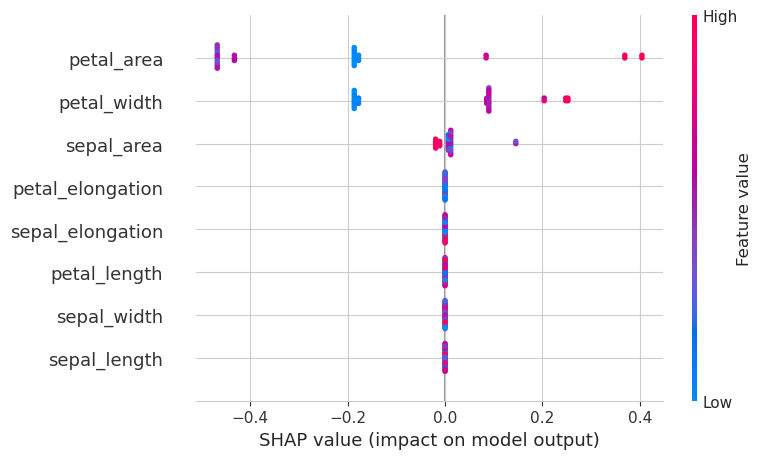

In [296]:
shap.summary_plot(shap_values[:,:,2], X_val, title=classes[2])

#### Model 2: `RandomForestClassifier`

In [297]:
model = 'rfc'

Pipeline:

In [298]:
# defining the pipeline
pipe[model] = Pipeline(steps=[('model', RandomForestClassifier(random_state=0))])

Hyperparameters to optimize:

In [299]:
# defining the hyperparameter grid
param_grid[model] = {
    'model__n_estimators': [50*i for i in range(1, 21)],
    'model__max_depth': [None] + [5*i for i in range(1, 11)]
    }

Grid:

In [300]:
# putting everything together
grid[model] = GridSearchCV(pipe[model],
                           param_grid=param_grid[model],
                           scoring='f1_macro',
                           cv=5,
                           n_jobs=-1)# 

Fitting the grid-pipeline to the data:

In [301]:
grid[model].fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('model',
                                        RandomForestClassifier(random_state=0))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [None, 5, 10, 15, 20, 25, 30, 35,
                                              40, 45, 50],
                         'model__n_estimators': [50, 100, 150, 200, 250, 300,
                                                 350, 400, 450, 500, 550, 600,
                                                 650, 700, 750, 800, 850, 900,
                                                 950, 1000]},
             scoring='f1_macro')

In [302]:
print(model, "results:\n","."*100)
for score, std, params in zip(grid[model].cv_results_['mean_test_score'], grid[model].cv_results_['std_test_score'], grid[model].cv_results_['params']):
    print(f"mean CV f1-macro score: {score:.4f} +- {std:.4e} -> {params}")

rfc results:
 ....................................................................................................
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_depth': None, 'model__n_estimators': 50}
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_depth': None, 'model__n_estimators': 100}
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_depth': None, 'model__n_estimators': 150}
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_depth': None, 'model__n_estimators': 200}
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_depth': None, 'model__n_estimators': 250}
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_depth': None, 'model__n_estimators': 300}
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_depth': None, 'model__n_estimators': 350}
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_depth': None, 'model__n_estimators': 400}
mean CV f1-macro score: 0.9423 +- 3.2882e-02 -> {'model__max_d

Finding the best estimator and its properties:

In [303]:
best['pipe'][model] = grid[model].best_estimator_
best['model'][model] = best['pipe'][model].named_steps['model']
best['score'][model] = grid[model].best_score_
best['params'][model] = grid[model].best_params_

print("best f1-macro:", best['score'][model])
print("best params:", best['params'][model])

best f1-macro: 0.9422953625894802
best params: {'model__max_depth': None, 'model__n_estimators': 50}


Let us compute the F1 scores of the entire dataset in more detail:

In [304]:
y_preds = best['model'][model].predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val, y_preds, average=avg)) # compute F1 for each different kind of average

val_score[model] = f1_score(y_val, y_preds, average='macro')

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [305]:
print(permutation_importance(best['model'][model], X_val, y_val))
feat_import = dict(zip(X_val.columns, permutation_importance(best['model'][model], X_val, y_val, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.02      , 0.        , 0.03333333, 0.02666667, 0.00666667,
       0.03333333, 0.02666667, 0.03333333]), 'importances_std': array([0.01632993, 0.        , 0.        , 0.01333333, 0.01333333,
       0.        , 0.01333333, 0.02108185]), 'importances': array([[0.03333333, 0.03333333, 0.        , 0.        , 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.03333333, 0.03333333, 0.03333333, 0.03333333, 0.03333333],
       [0.03333333, 0.03333333, 0.03333333, 0.        , 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.03333333],
       [0.03333333, 0.03333333, 0.03333333, 0.03333333, 0.03333333],
       [0.        , 0.03333333, 0.03333333, 0.03333333, 0.03333333],
       [0.03333333, 0.06666667, 0.03333333, 0.        , 0.03333333]])}


{'sepal_length': 0.02666666666666666,
 'sepal_width': 0.01333333333333333,
 'petal_length': 0.033333333333333326,
 'petal_width': 0.033333333333333326,
 'sepal_area': 0.0,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.02666666666666666,
 'petal_elongation': 0.01333333333333333}

So only three features are really being used:

In [306]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_length': 0.02666666666666666,
 'sepal_width': 0.01333333333333333,
 'petal_length': 0.033333333333333326,
 'petal_width': 0.033333333333333326,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.02666666666666666,
 'petal_elongation': 0.01333333333333333}

Let us look at the Decision Tree of our model:

{'setosa': 50, 'versicolor': 50, 'virginica': 50}
--------------------------------------------------
Best DecisionTreeClassifier:



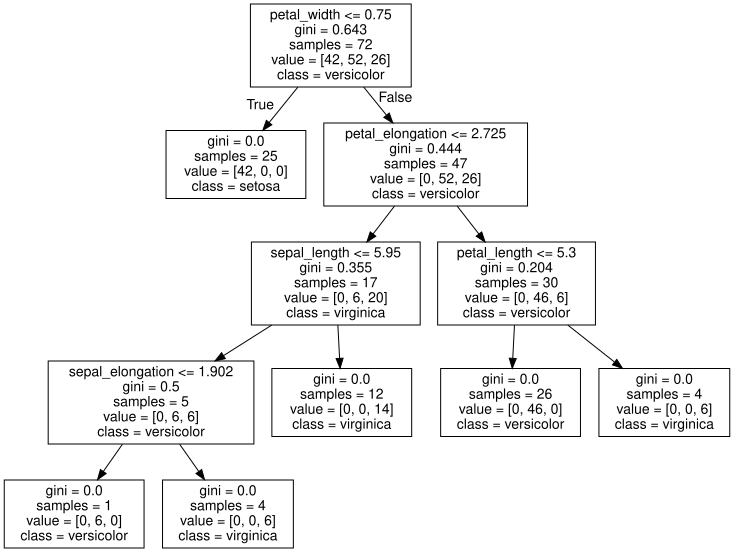

In [307]:
print({species:y.value_counts()[species] for species in classes})
print("-"*50)

tree_graph = tree.export_graphviz(best['model'][model].estimators_[0], out_file=None, feature_names=X.columns, class_names=classes)

print("Best DecisionTreeClassifier:\n")
graphviz.Source(tree_graph)

Let us now study the SHAP variables

In [308]:
explainer = shap.TreeExplainer(best['model'][model])
shap_values = explainer.shap_values(X_val)

print(shap_values.shape)

(30, 8, 3)


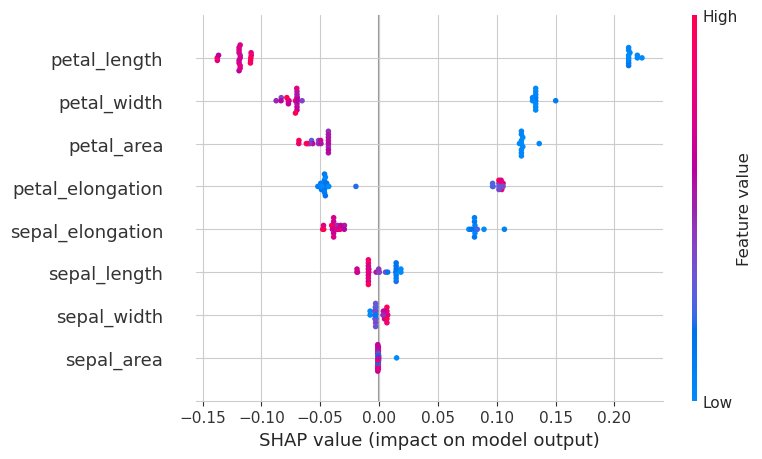

In [309]:
shap.summary_plot(shap_values[:,:,0], X_val, title=classes[0])

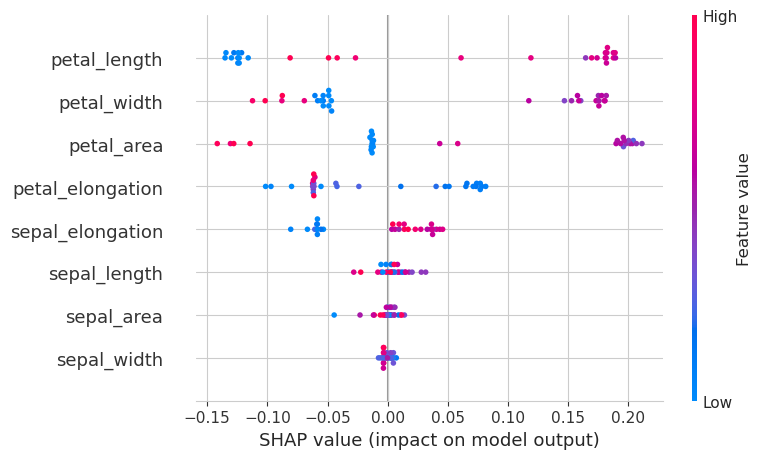

In [310]:
shap.summary_plot(shap_values[:,:,1], X_val, title=classes[1])

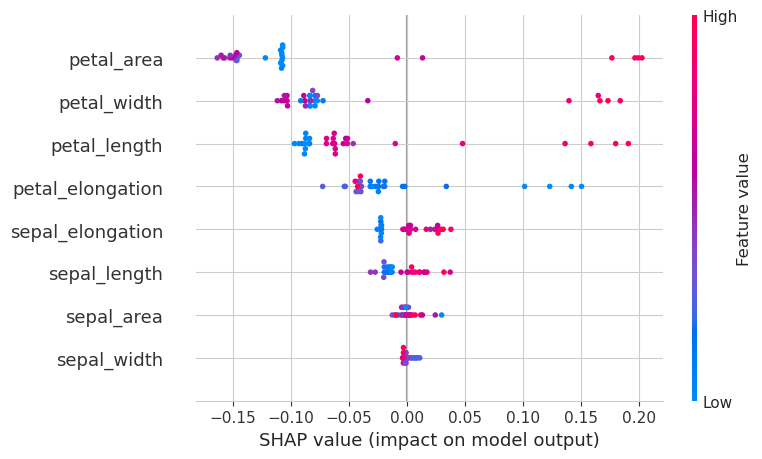

In [311]:
shap.summary_plot(shap_values[:,:,2], X_val, title=classes[2])

#### Model 3: `XGBClassifier`

In [322]:
model = 'xgbc'

Pipeline:

In [323]:
# defining the pipeline
pipe[model] = Pipeline(steps=[('model', XGBClassifier(random_state=0))])

In [324]:
# ?XGBClassifier

Hyperparameters to optimize:

In [325]:
# defining the hyperparameter grid
param_grid[model] = {
    'model__n_estimators': [100*i for i in range(1,21)],
    'model__learning_rate': [0.01*i for i in range(1,5)]+[0.05*i for i in range(1,11)]
    }

Grid:

In [326]:
# putting everything together
grid[model] = GridSearchCV(pipe[model],
                    param_grid=param_grid[model],
                    scoring='f1_macro',
                    cv=5,
                    n_jobs=-1)# 

Fitting the grid-pipeline to the data:

In [327]:
grid[model].fit(X_train, y_train_label)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('model',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      device=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=None,
                                                      feature_weights=None,
                                                      gamma=None,
                                                      grow_policy=None,
                                                      importance_type=None,
                                                      in...
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None, ...))]),
             n_jobs=-1,
             param_grid={'model__learning_rate': [0.01, 0.02, 0.03, 0.04, 0.05,
                                                  0.1, 0.15000000000000002, 0.2,
                                                  0.25, 0.30000000000000004,
                                                  0.35000000000000003, 0.4,
                                                  0.45, 0.5],
                         'model__n_estimators': [100, 200, 300, 400, 500, 600,
                                                 700, 800, 900, 1000, 1100,
                                                 1200, 1300, 1400, 1500, 1600,
                                                 1700, 1800, 1900, 2000]},
             scoring='f1_macro')

In [328]:
print(model, "results:\n","."*100)
for score, std, params in zip(grid[model].cv_results_['mean_test_score'], grid[model].cv_results_['std_test_score'], grid[model].cv_results_['params']):
    print(f"mean CV f1-macro score: {score:.4f} +- {std:.4e} -> {params}")

xgbc results:
 ....................................................................................................
mean CV f1-macro score: 0.9332 +- 1.9088e-02 -> {'model__learning_rate': 0.01, 'model__n_estimators': 100}
mean CV f1-macro score: 0.9332 +- 1.9088e-02 -> {'model__learning_rate': 0.01, 'model__n_estimators': 200}
mean CV f1-macro score: 0.9332 +- 1.9088e-02 -> {'model__learning_rate': 0.01, 'model__n_estimators': 300}
mean CV f1-macro score: 0.9332 +- 1.9088e-02 -> {'model__learning_rate': 0.01, 'model__n_estimators': 400}
mean CV f1-macro score: 0.9332 +- 1.9088e-02 -> {'model__learning_rate': 0.01, 'model__n_estimators': 500}
mean CV f1-macro score: 0.9332 +- 1.9088e-02 -> {'model__learning_rate': 0.01, 'model__n_estimators': 600}
mean CV f1-macro score: 0.9332 +- 1.9088e-02 -> {'model__learning_rate': 0.01, 'model__n_estimators': 700}
mean CV f1-macro score: 0.9332 +- 1.9088e-02 -> {'model__learning_rate': 0.01, 'model__n_estimators': 800}
mean CV f1-macro score: 0.93

Finding the best estimator and its properties:

In [329]:
best['pipe'][model] = grid[model].best_estimator_
best['model'][model] = best['pipe'][model].named_steps['model']
best['score'][model] = grid[model].best_score_
best['params'][model] = grid[model].best_params_

print("best f1-macro:", best['score'][model])
print("best params:", best['params'][model])

best f1-macro: 0.9415462424285955
best params: {'model__learning_rate': 0.03, 'model__n_estimators': 1700}


Let us compute the F1 scores of the entire dataset in more detail:

In [330]:
y_preds = best['model'][model].predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

val_score[model] = f1_score(y_val_label, y_preds, average='macro')

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [331]:
print(permutation_importance(best['model'][model], X_val, y_val_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best['model'][model], X_val, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.4       , 0.03333333, 0.00666667,
       0.        , 0.24      , 0.03333333]), 'importances_std': array([0.        , 0.        , 0.0843274 , 0.        , 0.01333333,
       0.        , 0.02494438, 0.        ]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.5       , 0.33333333, 0.3       , 0.5       , 0.36666667],
       [0.03333333, 0.03333333, 0.03333333, 0.03333333, 0.03333333],
       [0.        , 0.        , 0.03333333, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.26666667, 0.23333333, 0.2       , 0.26666667, 0.23333333],
       [0.03333333, 0.03333333, 0.03333333, 0.03333333, 0.03333333]])}


{'sepal_length': 0.0,
 'sepal_width': 0.0,
 'petal_length': 0.5,
 'petal_width': 0.019999999999999997,
 'sepal_area': 0.01333333333333333,
 'sepal_elongation': 0.0,
 'petal_area': 0.18666666666666662,
 'petal_elongation': 0.019999999999999997}

So only three features are really being used:

In [332]:
{key:val for key, val in feat_import.items() if val > 0}

{'petal_length': 0.5,
 'petal_width': 0.019999999999999997,
 'sepal_area': 0.01333333333333333,
 'petal_area': 0.18666666666666662,
 'petal_elongation': 0.019999999999999997}

Let us now study the SHAP variables

In [333]:
explainer = shap.TreeExplainer(best['model'][model])
shap_values = explainer.shap_values(X_val)

print(shap_values.shape)

(30, 8, 3)


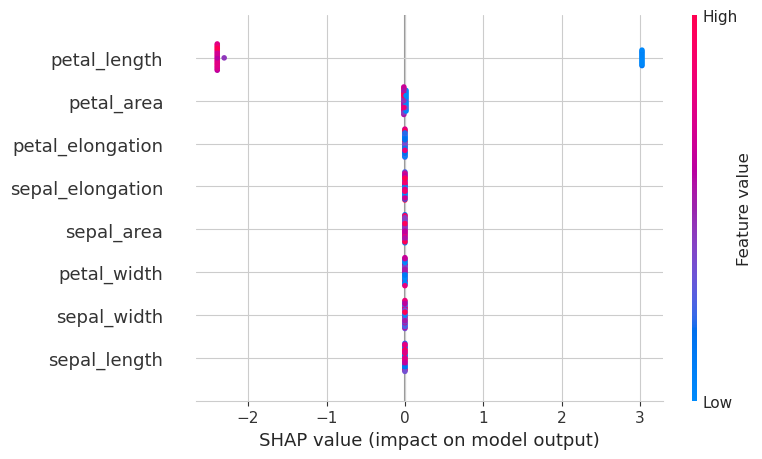

In [334]:
shap.summary_plot(shap_values[:,:,0], X_val, title=classes[0])

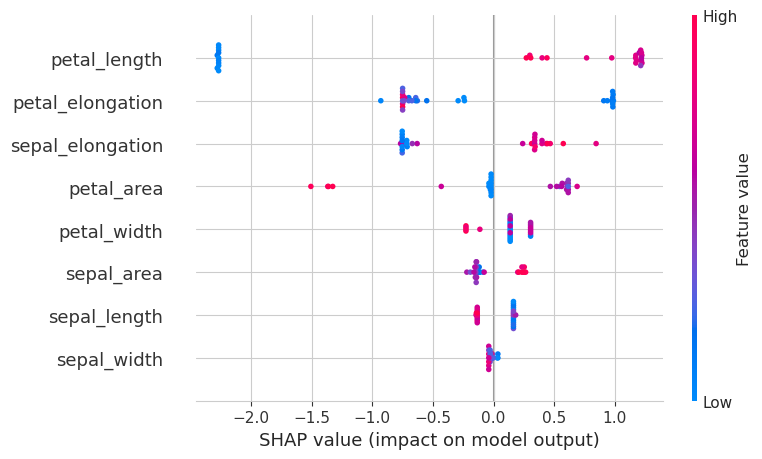

In [335]:
shap.summary_plot(shap_values[:,:,1], X_val, title=classes[1])

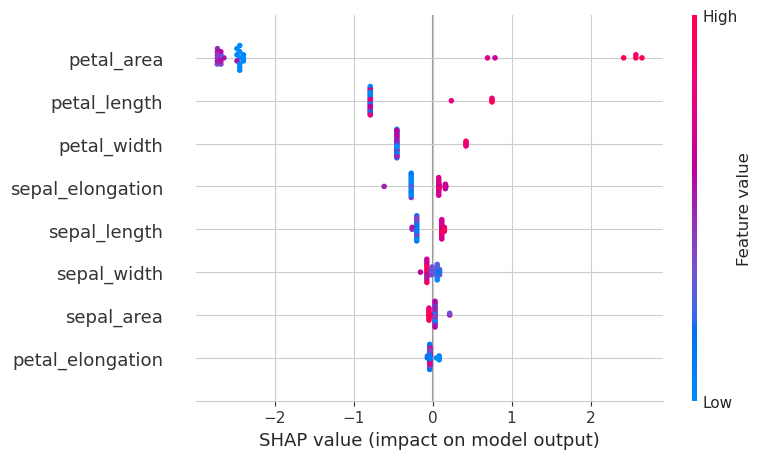

In [336]:
shap.summary_plot(shap_values[:,:,2], X_val, title=classes[2])

#### Model 4: `LogisticRegression`

In [337]:
model = 'logreg'

Pipeline:

In [338]:
# defining the pipeline
pipe[model] = Pipeline(steps=[('box-cox', boxcox_scaler),
                              ('z-scaler', z_scaler),
                              ('model', LogisticRegression())])

Hyperparameters to optimize:

In [339]:
# defining the hyperparameter grid
param_grid[model] = {
    'model__C': [0.5*i for i in range(1,21)],
    'model__penalty': [None, 'l2', 'l1', 'elasticnet']
    }

Grid:

In [340]:
# putting everything together
grid[model] = GridSearchCV(pipe[model],
                    param_grid=param_grid[model],
                    scoring='f1_macro',
                    cv=5,
                    n_jobs=-1)# 

Fitting the grid-pipeline to the data:

In [341]:
grid[model].fit(X_train, y_train_label)

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklea

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('box-cox',
                                        PowerTransformer(method='box-cox')),
                                       ('z-scaler', StandardScaler()),
                                       ('model', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'model__C': [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0,
                                      4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0,
                                      8.5, 9.0, 9.5, 10.0],
                         'model__penalty': [None, 'l2', 'l1', 'elasticnet']},
             scoring='f1_macro')

In [342]:
print(model, "results:\n","."*100)
for score, std, params in zip(grid[model].cv_results_['mean_test_score'], grid[model].cv_results_['std_test_score'], grid[model].cv_results_['params']):
    print(f"mean CV f1-macro score: {score:.4f} +- {std:.4e} -> {params}")

logreg results:
 ....................................................................................................
mean CV f1-macro score: 0.9408 +- 3.3942e-02 -> {'model__C': 0.5, 'model__penalty': None}
mean CV f1-macro score: 0.9499 +- 3.1543e-02 -> {'model__C': 0.5, 'model__penalty': 'l2'}
mean CV f1-macro score: nan +- nan -> {'model__C': 0.5, 'model__penalty': 'l1'}
mean CV f1-macro score: nan +- nan -> {'model__C': 0.5, 'model__penalty': 'elasticnet'}
mean CV f1-macro score: 0.9408 +- 3.3942e-02 -> {'model__C': 1.0, 'model__penalty': None}
mean CV f1-macro score: 0.9499 +- 3.1543e-02 -> {'model__C': 1.0, 'model__penalty': 'l2'}
mean CV f1-macro score: nan +- nan -> {'model__C': 1.0, 'model__penalty': 'l1'}
mean CV f1-macro score: nan +- nan -> {'model__C': 1.0, 'model__penalty': 'elasticnet'}
mean CV f1-macro score: 0.9408 +- 3.3942e-02 -> {'model__C': 1.5, 'model__penalty': None}
mean CV f1-macro score: 0.9420 +- 3.2755e-02 -> {'model__C': 1.5, 'model__penalty': 'l2'}
mean C

Finding the best estimator and its properties:

In [343]:
best['pipe'][model] = grid[model].best_estimator_
best['model'][model] = best['pipe'][model].named_steps['model']
best['score'][model] = grid[model].best_score_
best['params'][model] = grid[model].best_params_

print("best f1-macro:", best['score'][model])
print("best params:", best['params'][model])

best f1-macro: 0.9499220020891848
best params: {'model__C': 0.5, 'model__penalty': 'l2'}


Let us compute the F1 scores of the entire dataset in more detail:

In [344]:
y_preds = best['model'][model].predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

val_score[model] = f1_score(y_val_label, y_preds, average='macro')

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [345]:
print(permutation_importance(best['model'][model], X_val_scaled, y_val_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best['model'][model], X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.05333333, 0.04      , 0.        ,
       0.        , 0.04666667, 0.04      ]), 'importances_std': array([0.        , 0.        , 0.02666667, 0.03887301, 0.        ,
       0.        , 0.03399346, 0.03887301]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.03333333, 0.03333333, 0.1       , 0.06666667, 0.03333333],
       [0.03333333, 0.        , 0.06666667, 0.1       , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.03333333, 0.        , 0.06666667, 0.1       , 0.03333333],
       [0.06666667, 0.        , 0.03333333, 0.1       , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.006666666666666665,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.06666666666666665,
 'sepal_area': 0.0,
 'sepal_elongation': 0.0,
 'petal_area': 0.059999999999999984,
 'petal_elongation': 0.05333333333333332}

So only three features are really being used:

In [346]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.006666666666666665,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.06666666666666665,
 'petal_area': 0.059999999999999984,
 'petal_elongation': 0.05333333333333332}

Let us now study the SHAP variables

In [347]:
explainer = explainer = shap.LinearExplainer(best['model'][model], X_train_scaled)
shap_values = explainer.shap_values(X_val_scaled)

print(shap_values.shape)

(30, 8, 3)


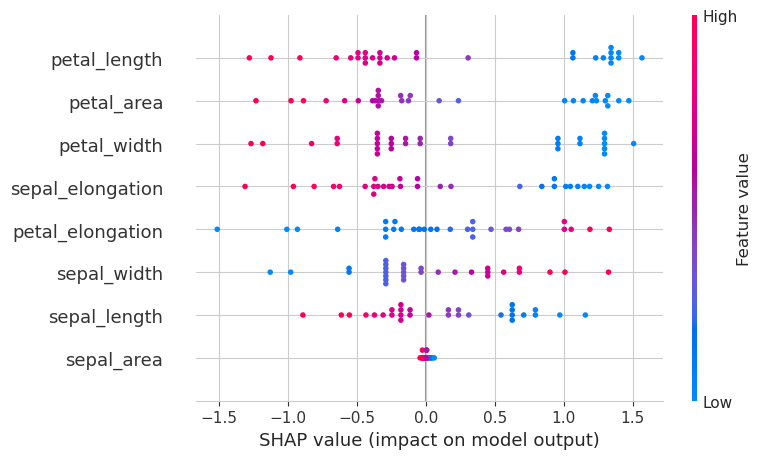

In [348]:
shap.summary_plot(shap_values[:,:,0], X_val, title=classes[0])

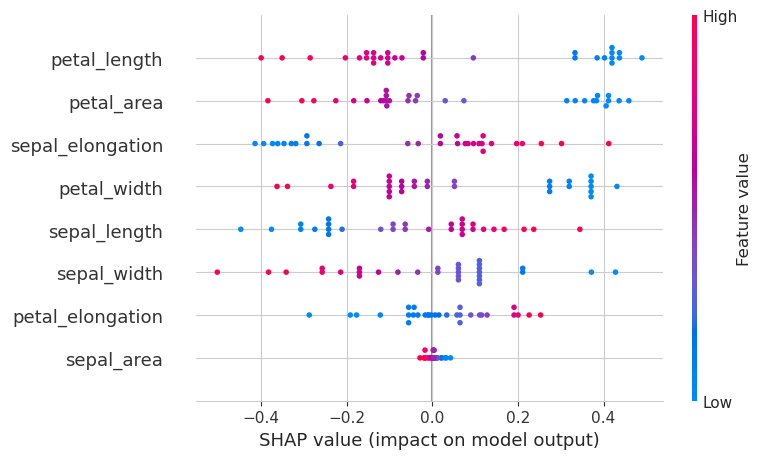

In [349]:
shap.summary_plot(shap_values[:,:,1], X_val, title=classes[1])

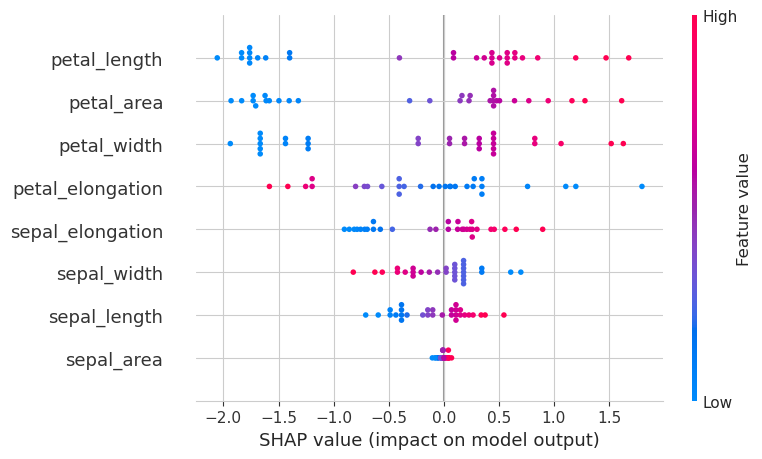

In [350]:
shap.summary_plot(shap_values[:,:,2], X_val, title=classes[2])

#### Model 5: `KNeighborsClassifier`

In [351]:
model = 'knn'

Pipeline:

In [352]:
# defining the pipeline
pipe[model] = Pipeline(steps=[('box-cox', boxcox_scaler),
                              ('z-scaler', z_scaler),
                              ('model', KNeighborsClassifier())])

Hyperparameters to optimize:

In [353]:
# ?KNeighborsClassifier

In [354]:
# defining the hyperparameter grid
param_grid[model] = {
    'model__n_neighbors': list(range(3, 11)),
    'model__weights': ['uniform', 'distance'],
    'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'model__leaf_size': [10*i for i in range(1, 5)],
    'model__p': [1, 2]
    }

Grid:

In [355]:
# putting everything together
grid[model] = GridSearchCV(pipe[model],
                    param_grid=param_grid[model],
                    scoring='f1_macro',
                    cv=5,
                    n_jobs=-1)# 

Fitting the grid-pipeline to the data:

In [356]:
grid[model].fit(X_train, y_train_label)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('box-cox',
                                        PowerTransformer(method='box-cox')),
                                       ('z-scaler', StandardScaler()),
                                       ('model', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'model__algorithm': ['auto', 'ball_tree', 'kd_tree',
                                              'brute'],
                         'model__leaf_size': [10, 20, 30, 40],
                         'model__n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10],
                         'model__p': [1, 2],
                         'model__weights': ['uniform', 'distance']},
             scoring='f1_macro')

In [357]:
print(model, "results:\n","."*100)
for score, std, params in zip(grid[model].cv_results_['mean_test_score'], grid[model].cv_results_['std_test_score'], grid[model].cv_results_['params']):
    print(f"mean CV f1-macro score: {score:.4f} +- {std:.4e} -> {params}")

knn results:
 ....................................................................................................
mean CV f1-macro score: 0.9425 +- 4.8655e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 1, 'model__weights': 'uniform'}
mean CV f1-macro score: 0.9425 +- 4.8655e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 1, 'model__weights': 'distance'}
mean CV f1-macro score: 0.9337 +- 4.0766e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 2, 'model__weights': 'uniform'}
mean CV f1-macro score: 0.9337 +- 4.0766e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 2, 'model__weights': 'distance'}
mean CV f1-macro score: 0.9261 +- 2.8898e-02 -> {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 4, 'model__p': 1, 'model__weights': 'uniform'}
mean CV f1-macro score: 0.9336 +-

Finding the best estimator and its properties:

In [358]:
best['pipe'][model] = grid[model].best_estimator_
best['model'][model] = best['pipe'][model].named_steps['model']
best['score'][model] = grid[model].best_score_
best['params'][model] = grid[model].best_params_

print("best f1-macro:", best['score'][model])
print("best params:", best['params'][model])

best f1-macro: 0.9425424672793093
best params: {'model__algorithm': 'auto', 'model__leaf_size': 10, 'model__n_neighbors': 3, 'model__p': 1, 'model__weights': 'uniform'}


Let us compute the F1 scores of the entire dataset in more detail:

In [359]:
y_preds = best['model'][model].predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

val_score[model] = f1_score(y_val_label, y_preds, average='macro')

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [360]:
print(permutation_importance(best['model'][model], X_val_scaled, y_val_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best['model'][model], X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.01333333, 0.01333333, 0.01333333,
       0.        , 0.00666667, 0.01333333]), 'importances_std': array([0.        , 0.        , 0.01632993, 0.01632993, 0.01632993,
       0.        , 0.01333333, 0.02666667]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.03333333, 0.03333333, 0.        , 0.        , 0.        ],
       [0.03333333, 0.03333333, 0.        , 0.        , 0.        ],
       [0.        , 0.03333333, 0.        , 0.        , 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.03333333, 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.06666667, 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.006666666666666665,
 'petal_length': 0.01333333333333333,
 'petal_width': 0.01333333333333333,
 'sepal_area': 0.006666666666666665,
 'sepal_elongation': 0.0,
 'petal_area': 0.006666666666666665,
 'petal_elongation': 0.0}

So only three features are really being used:

In [361]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.006666666666666665,
 'petal_length': 0.01333333333333333,
 'petal_width': 0.01333333333333333,
 'sepal_area': 0.006666666666666665,
 'petal_area': 0.006666666666666665}

Let us now study the SHAP variables

In [362]:
explainer = explainer = shap.KernelExplainer(best['model'][model].predict_proba, X_train_scaled)
shap_values = explainer.shap_values(X_val_scaled)

print(shap_values.shape)

Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/30 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.02340608, -0.02912037, -0.06258598, -0.05832011, -0.0059127 ,
       -0.03874339, -0.06009921, -0.04403439])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.00287037,  0.02748677, -0.02847222, -0.1132672 ,  0.02185185,
        0.0102381 , -0.07441138, -0.15444444])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 0.02627646,  0.0016336 ,  0.0910582 ,  0.1715873 , -0.01593915,
        0.02850529,  0.13451058,  0.19847884])
num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.02689153, -0.05863095, -0.05122354, -0.04107804, -0.01833333,
       -0.05939153, -0.0454828 , -0.02119048])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.00948743, -0.01993056,  0.110671

(30, 8, 3)


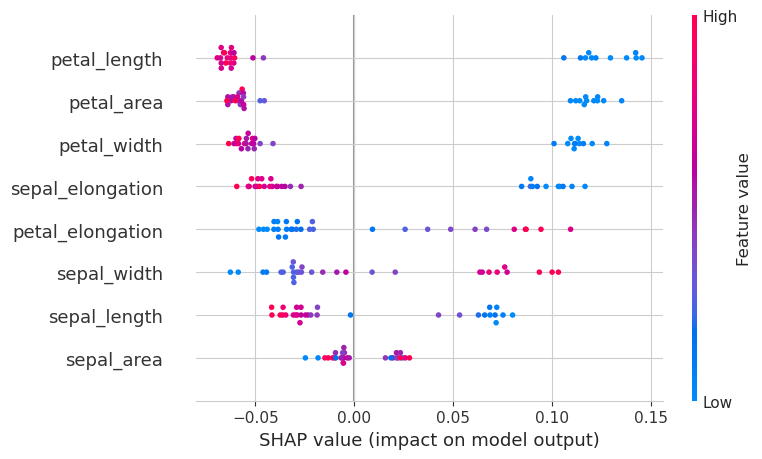

In [363]:
shap.summary_plot(shap_values[:,:,0], X_val, title=classes[0])

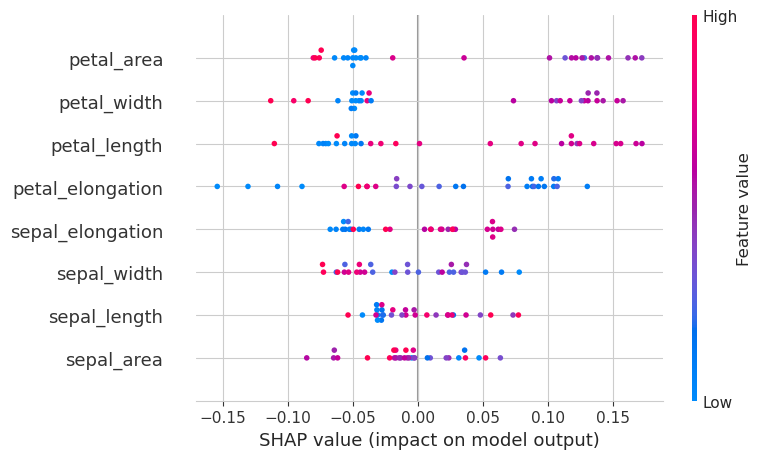

In [364]:
shap.summary_plot(shap_values[:,:,1], X_val, title=classes[1])

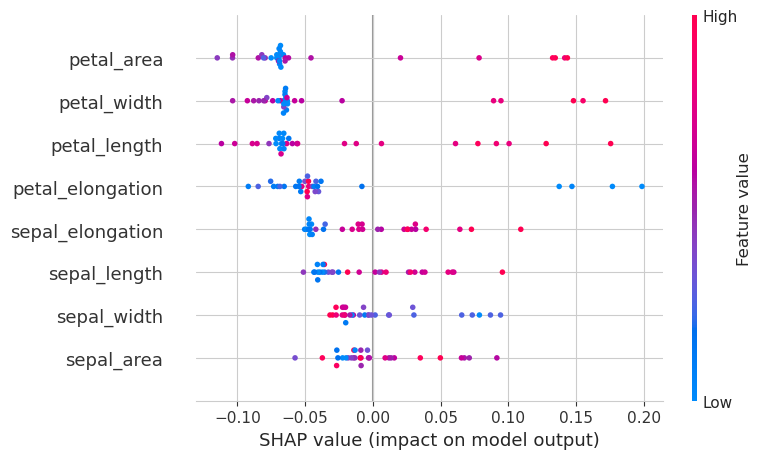

In [365]:
shap.summary_plot(shap_values[:,:,2], X_val, title=classes[2])

#### Model 6: `SVC`

In [366]:
model = 'svc'

Pipeline:

In [367]:
# ?SVC

In [368]:
# defining the pipeline
pipe[model] = Pipeline(steps=[('box-cox', boxcox_scaler),
                              ('z-scaler', z_scaler),
                              ('model', SVC(random_state=0))])

Hyperparameters to optimize:

In [369]:
# defining the hyperparameter grid
param_grid[model] = {
    'model__C': [0.5*i for i in range(1,21)],
    'model__kernel': ['rbf', 'linear', 'poly', 'sigmoid', 'precomputed'],
    'model__degree': [1, 2, 3, 4, 5],
    'model__gamma': ['scale', 'auto'],
    'model__probability': [False, True]
    }

Grid:

In [370]:
# putting everything together
grid[model] = GridSearchCV(pipe[model],
                    param_grid=param_grid[model],
                    scoring='f1_macro',
                    cv=5,
                    n_jobs=-1)# 

Fitting the grid-pipeline to the data:

In [371]:
grid[model].fit(X_train, y_train_label)

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
2000 fits failed out of a total of 10000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2000 fits failed with the following error:
Traceback (most recent call last):
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/pipel

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('box-cox',
                                        PowerTransformer(method='box-cox')),
                                       ('z-scaler', StandardScaler()),
                                       ('model', SVC(random_state=0))]),
             n_jobs=-1,
             param_grid={'model__C': [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0,
                                      4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0,
                                      8.5, 9.0, 9.5, 10.0],
                         'model__degree': [1, 2, 3, 4, 5],
                         'model__gamma': ['scale', 'auto'],
                         'model__kernel': ['rbf', 'linear', 'poly', 'sigmoid',
                                           'precomputed'],
                         'model__probability': [False, True]},
             scoring='f1_macro')

In [372]:
print(model, "results:\n","."*100)
for score, std, params in zip(grid[model].cv_results_['mean_test_score'], grid[model].cv_results_['std_test_score'], grid[model].cv_results_['params']):
    print(f"mean CV f1-macro score: {score:.4f} +- {std:.4e} -> {params}")

svc results:
 ....................................................................................................
mean CV f1-macro score: 0.9321 +- 4.4390e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'rbf', 'model__probability': False}
mean CV f1-macro score: 0.9321 +- 4.4390e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'rbf', 'model__probability': True}
mean CV f1-macro score: 0.9330 +- 4.3297e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'linear', 'model__probability': False}
mean CV f1-macro score: 0.9330 +- 4.3297e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'linear', 'model__probability': True}
mean CV f1-macro score: 0.9499 +- 3.1543e-02 -> {'model__C': 0.5, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'poly', 'model__probability': False}
mean CV f1-macro score: 0.9499 +- 3.1543e-02 -> {'model__C':

Finding the best estimator and its properties:

In [373]:
best['pipe'][model] = grid[model].best_estimator_
best['model'][model] = best['pipe'][model].named_steps['model']
best['score'][model] = grid[model].best_score_
best['params'][model] = grid[model].best_params_

print("best f1-macro:", best['score'][model])
print("best params:", best['params'][model])

best f1-macro: 0.9503250521981172
best params: {'model__C': 2.0, 'model__degree': 1, 'model__gamma': 'scale', 'model__kernel': 'poly', 'model__probability': False}


Let us compute the F1 scores of the entire dataset in more detail:

In [374]:
y_preds = best['model'][model].predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

val_score[model] = f1_score(y_val_label, y_preds, average='macro')

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [375]:
print(permutation_importance(best['model'][model], X_val_scaled, y_val_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best['model'][model], X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.00666667, 0.08666667, 0.07333333, 0.        ,
       0.        , 0.07333333, 0.02666667]), 'importances_std': array([0.        , 0.01333333, 0.01632993, 0.05333333, 0.        ,
       0.        , 0.05333333, 0.01333333]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.03333333, 0.        ],
       [0.1       , 0.06666667, 0.06666667, 0.1       , 0.1       ],
       [0.13333333, 0.13333333, 0.        , 0.06666667, 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.13333333, 0.13333333, 0.        , 0.06666667, 0.03333333],
       [0.03333333, 0.03333333, 0.        , 0.03333333, 0.03333333]])}


{'sepal_length': 0.0,
 'sepal_width': 0.0,
 'petal_length': 0.08666666666666664,
 'petal_width': 0.06666666666666665,
 'sepal_area': 0.0,
 'sepal_elongation': 0.0,
 'petal_area': 0.06666666666666665,
 'petal_elongation': 0.02666666666666666}

So only three features are really being used:

In [376]:
{key:val for key, val in feat_import.items() if val > 0}

{'petal_length': 0.08666666666666664,
 'petal_width': 0.06666666666666665,
 'petal_area': 0.06666666666666665,
 'petal_elongation': 0.02666666666666666}

### Exploratory: standard validation

By this I mean that we are not using cross-validation, but only the Training and Validation datasets created above.

#### Model 1: `DecisionTreeClassifier`

In [35]:
# ?DecisionTreeClassifier

Begin by defining the `DecisionTreeClassifier` model, with given arguments (in particular, the `max_leaf_nodes` hyperparameter).

In [36]:
def model_dtc(max_leaf_nodes, criterion):
    return DecisionTreeClassifier(random_state=0, max_leaf_nodes=max_leaf_nodes, criterion=criterion)

Now, defining a function to compute the F1 score of the model:

In [37]:
def get_f1score(max_leaf_nodes, criterion, Xydata, avg='macro'):

    X_train, X_val, y_train, y_val = Xydata

    model = model_dtc(max_leaf_nodes, criterion)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

Performing the training and fit for various choices of hyperparameter `max_leaf_nodes`:

In [38]:
crit = 'gini' # splitting criterion
avg = 'macro' # macro average for F1

mln_list = [None] + list(range(2, 11)) # consider a range of values

f1s_list = [get_f1score(mln, crit, (X_train, X_val, y_train, y_val), avg=avg) for mln in mln_list] # computing F1

In [39]:
# showing results
mln_f1s = dict(zip(mln_list, f1s_list))

for key, val in mln_f1s.items():
    print('max_leaf_nodes =', str(key)+', \t f1 =', val)

max_leaf_nodes = None, 	 f1 = 0.957351290684624
max_leaf_nodes = 2, 	 f1 = 0.49333333333333335
max_leaf_nodes = 3, 	 f1 = 0.9095238095238095
max_leaf_nodes = 4, 	 f1 = 0.9095238095238095
max_leaf_nodes = 5, 	 f1 = 1.0
max_leaf_nodes = 6, 	 f1 = 0.957351290684624
max_leaf_nodes = 7, 	 f1 = 0.957351290684624
max_leaf_nodes = 8, 	 f1 = 0.957351290684624
max_leaf_nodes = 9, 	 f1 = 0.957351290684624
max_leaf_nodes = 10, 	 f1 = 0.957351290684624


We have found the best choice of hyperparameter:

In [40]:
best_max_leaf_nodes = max(mln_f1s, key=mln_f1s.get)
best_dtc_model = model_dtc(best_max_leaf_nodes, crit)

print("best max_leaf_nodes =", best_max_leaf_nodes)

best max_leaf_nodes = 5


Let us compute the F1 scores in more detail:

In [41]:
best_dtc_model.fit(X_train, y_train) # fit the model once more
y_preds = best_dtc_model.predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [42]:
print(permutation_importance(best_dtc_model, X_train, y_train))
feat_import = dict(zip(X_val.columns, permutation_importance(best_dtc_model, X_val, y_val, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.        , 0.47666667, 0.015     ,
       0.        , 0.35333333, 0.        ]), 'importances_std': array([0.        , 0.        , 0.        , 0.03551213, 0.0062361 ,
       0.        , 0.02333333, 0.        ]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.48333333, 0.48333333, 0.45833333, 0.53333333, 0.425     ],
       [0.00833333, 0.01666667, 0.025     , 0.00833333, 0.01666667],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.375     , 0.375     , 0.36666667, 0.325     , 0.325     ],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.0,
 'petal_length': 0.0,
 'petal_width': 0.5333333333333333,
 'sepal_area': 0.019999999999999997,
 'sepal_elongation': 0.0,
 'petal_area': 0.21333333333333332,
 'petal_elongation': 0.0}

So only three features are really being used:

In [43]:
{key:val for key, val in feat_import.items() if val > 0}

{'petal_width': 0.5333333333333333,
 'sepal_area': 0.019999999999999997,
 'petal_area': 0.21333333333333332}

Let us look at the Decision Tree of our model:

{'setosa': 39, 'versicolor': 37, 'virginica': 44}
--------------------------------------------------
Best DecisionTreeClassifier:



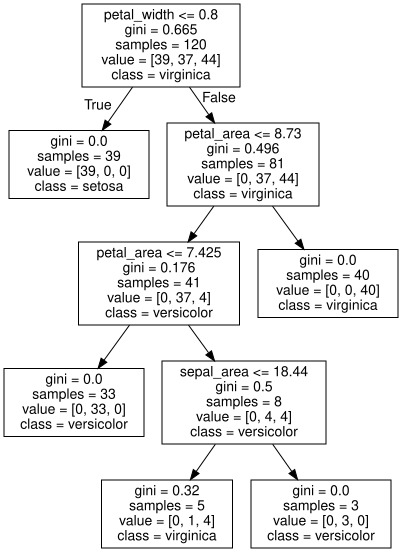

In [44]:
print({species:y_train.value_counts()[species] for species in classes})
print("-"*50)

tree_graph = tree.export_graphviz(best_dtc_model, out_file=None, feature_names=X.columns, class_names=classes)

print("Best DecisionTreeClassifier:\n")
graphviz.Source(tree_graph)

Let us now study the SHAP variables

In [45]:
explainer = shap.TreeExplainer(best_dtc_model)
dtc_shap_values = explainer.shap_values(X_val)

print(dtc_shap_values.shape)

(30, 8, 3)


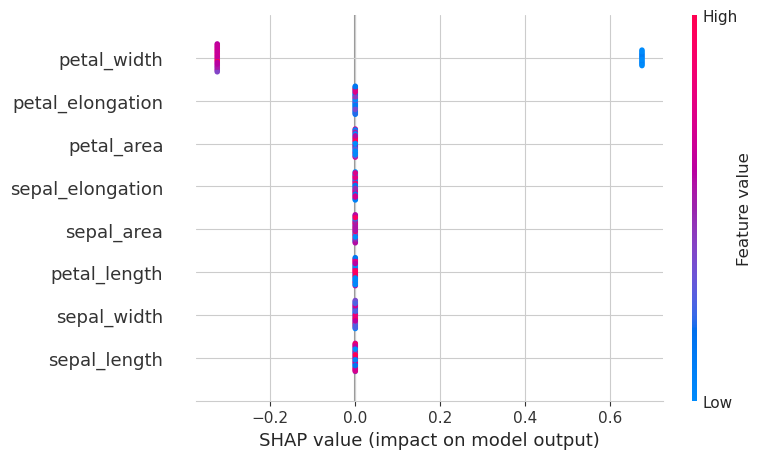

In [46]:
shap.summary_plot(dtc_shap_values[:,:,0], X_val, title=classes[0])

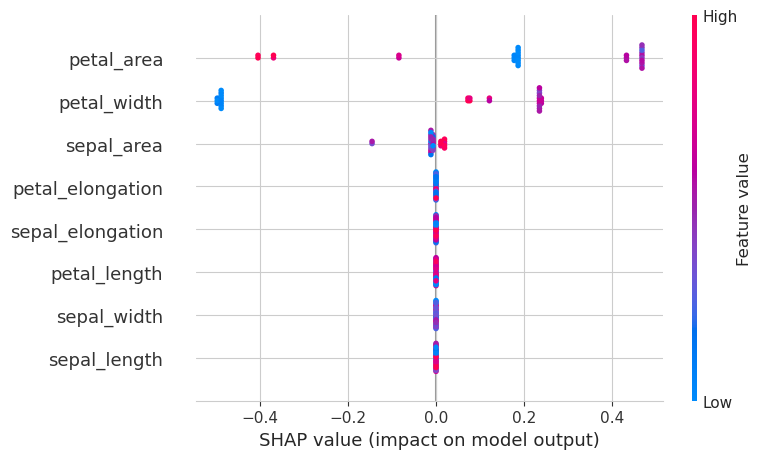

In [47]:
shap.summary_plot(dtc_shap_values[:,:,1], X_val, title=classes[1])

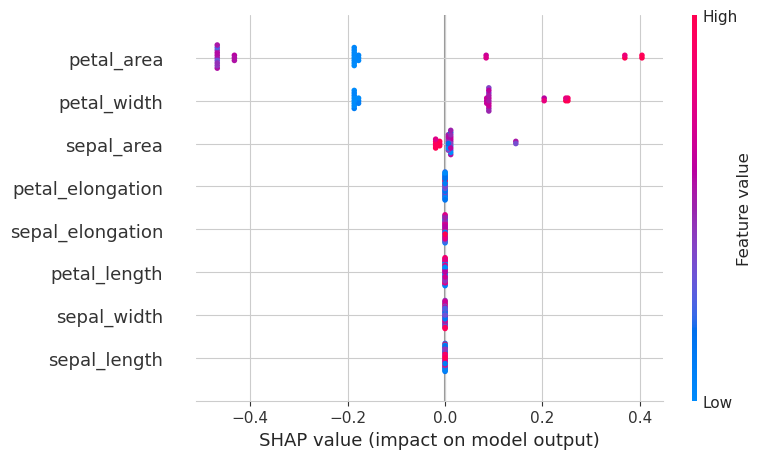

In [48]:
shap.summary_plot(dtc_shap_values[:,:,2], X_val, title=classes[2])

#### Model 2: `RandomForestClassifier`

In [49]:
# ?RandomForestClassifier

Begin by defining the `RandomForestClassifier` model, with given arguments (in particular, the `max_leaf_nodes` hyperparameter).

In [50]:
def model_rfc(max_leaf_nodes, n_estimators=100):
    return RandomForestClassifier(random_state=0, n_estimators=n_estimators, max_leaf_nodes=max_leaf_nodes)

Now, defining a function to compute the F1 score of the model:

In [51]:
def get_f1score(max_leaf_nodes, Xydata, avg='macro', n_estimators=100):

    X_train, X_val, y_train, y_val = Xydata

    model = model_rfc(max_leaf_nodes, n_estimators=n_estimators)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

Performing the training and fit for various choices of hyperparameter `max_leaf_nodes`:

In [52]:
crit = 'gini' # splitting criterion
nest = 100 # the default values of 100 performs very well!
avg = 'macro' # macro average for F1

mln_list = [None] + list(range(2, 11)) # consider a range of values
nest_list = [100*i for i in range(1,4)]

f1s_list = [get_f1score(mln, (X_train, X_val, y_train, y_val), avg=avg, n_estimators=nest) for mln in mln_list] # computing F1

In [53]:
# showing results
mln_f1s = dict(zip(mln_list, f1s_list))

for key, val in mln_f1s.items():
    print('max_leaf_nodes =', str(key)+', \t f1 =', val)

max_leaf_nodes = None, 	 f1 = 1.0
max_leaf_nodes = 2, 	 f1 = 0.9610256410256411
max_leaf_nodes = 3, 	 f1 = 0.957351290684624
max_leaf_nodes = 4, 	 f1 = 0.957351290684624
max_leaf_nodes = 5, 	 f1 = 0.957351290684624
max_leaf_nodes = 6, 	 f1 = 1.0
max_leaf_nodes = 7, 	 f1 = 1.0
max_leaf_nodes = 8, 	 f1 = 1.0
max_leaf_nodes = 9, 	 f1 = 1.0
max_leaf_nodes = 10, 	 f1 = 1.0


We have found the best choice of hyperparameter:

In [54]:
best_max_leaf_nodes = max(mln_f1s, key=mln_f1s.get)
best_rfc_model = model_rfc(best_max_leaf_nodes)

print("best max_leaf_nodes =", best_max_leaf_nodes)

best max_leaf_nodes = None


Let us compute the F1 scores in more detail:

In [55]:
best_rfc_model.fit(X_train, y_train) # fit the model once more
y_preds = best_rfc_model.predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [56]:
print(permutation_importance(best_rfc_model, X_train, y_train))
feat_import = dict(zip(X_val.columns, permutation_importance(best_rfc_model, X_val, y_val, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.00666667, 0.01833333, 0.00666667, 0.        ,
       0.015     , 0.02833333, 0.        ]), 'importances_std': array([0.        , 0.00333333, 0.0062361 , 0.00816497, 0.        ,
       0.00333333, 0.01      , 0.        ]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.00833333, 0.00833333, 0.00833333, 0.00833333],
       [0.025     , 0.00833333, 0.025     , 0.01666667, 0.01666667],
       [0.        , 0.01666667, 0.        , 0.        , 0.01666667],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.01666667, 0.01666667, 0.01666667, 0.00833333, 0.01666667],
       [0.01666667, 0.04166667, 0.03333333, 0.01666667, 0.03333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.01333333333333333,
 'petal_length': 0.033333333333333326,
 'petal_width': 0.01333333333333333,
 'sepal_area': 0.0,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.033333333333333326,
 'petal_elongation': 0.0}

Five features are really being used:

In [57]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.01333333333333333,
 'petal_length': 0.033333333333333326,
 'petal_width': 0.01333333333333333,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.033333333333333326}

Let us look at the Decision Tree of our model:

Example tree from RandomForestClassifier:



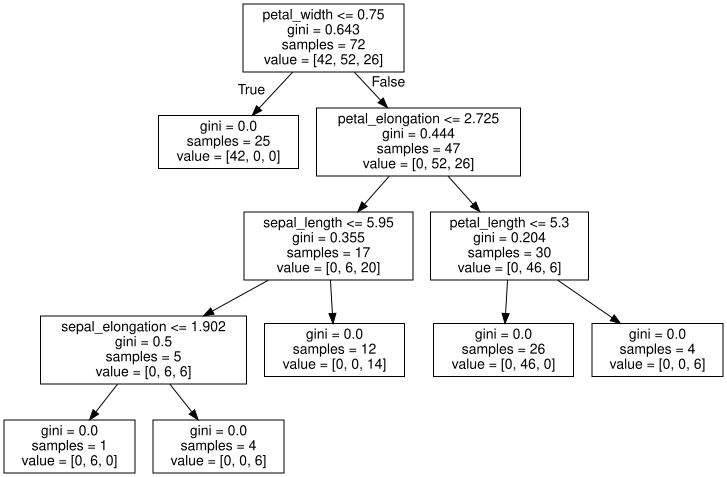

In [58]:
estimator_graph = tree.export_graphviz(best_rfc_model.estimators_[0], out_file=None, feature_names=X.columns)

print("Example tree from RandomForestClassifier:\n")
graphviz.Source(estimator_graph)

Finally, the SHAP variables:

In [59]:
explainer = shap.TreeExplainer(best_rfc_model)
rfc_shap_values = explainer.shap_values(X_val)

print(rfc_shap_values.shape)

(30, 8, 3)


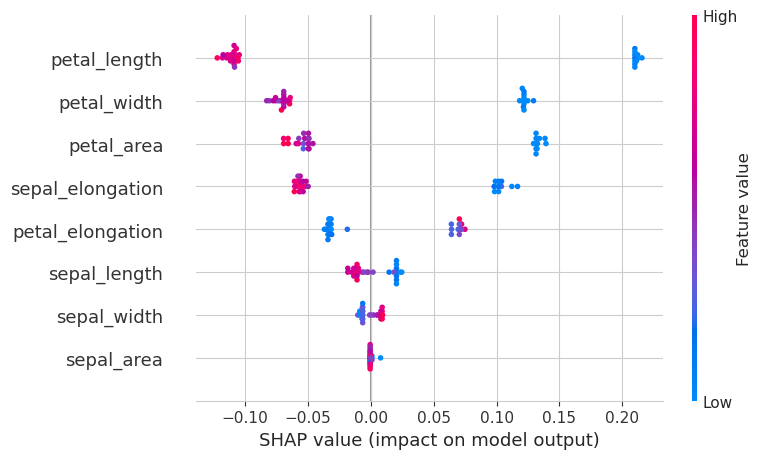

In [60]:
shap.summary_plot(rfc_shap_values[:,:,0], X_val, title=classes[0])

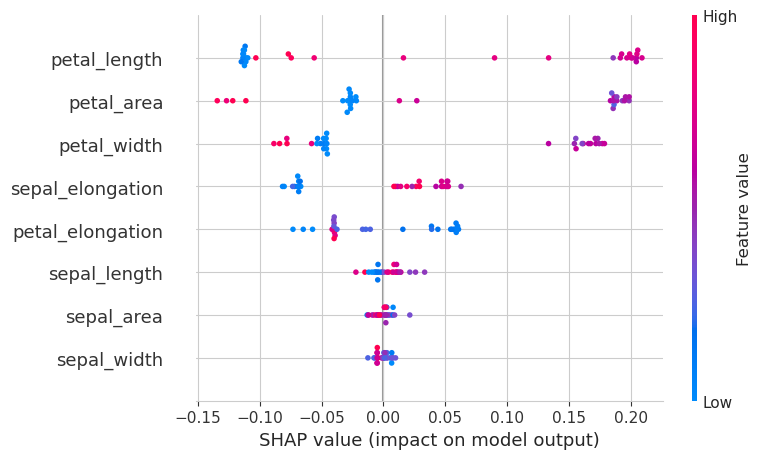

In [61]:
shap.summary_plot(rfc_shap_values[:,:,1], X_val, title=classes[1])

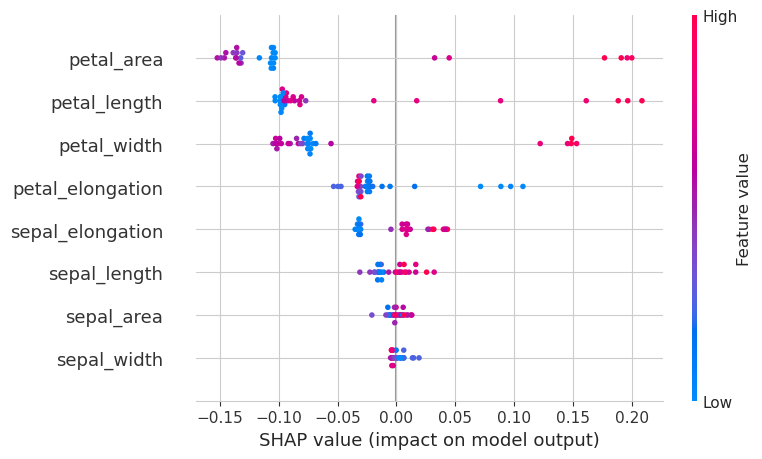

In [62]:
shap.summary_plot(rfc_shap_values[:,:,2], X_val, title=classes[2])

#### Model 3: `XGBClassifier`

In [63]:
# ?XGBClassifier

In [64]:
def model_xgbc(n_estimators=1000, learning_rate=0.05):
    return XGBClassifier(random_state=0, n_estimators=n_estimators, learning_rate=learning_rate)

In [65]:
def get_f1score(Xydata, avg='macro', n_estimators=100, learning_rate=0.05):

    X_train, X_val, y_train, y_val = Xydata

    model = model_xgbc(n_estimators=n_estimators, learning_rate=0.05)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [66]:
avg = 'macro' # macro average for F1

nest_list = [100*i for i in range(1,21)]
learn_list = [0.05*i for i in range(1,11)]

f1s_list = [[get_f1score((X_train, X_val, y_train_label, y_val_label), avg=avg, n_estimators=nest, learning_rate=learn) for nest in nest_list] for learn in learn_list] # computing F1

In [67]:
print(f1s_list)
print(max([max(f1s) for f1s in f1s_list]))

[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

All models seem equally good, so let's just use this default:

In [68]:
best_xgbc_model = model_xgbc()

Computing the F1 scores:

In [69]:
best_xgbc_model.fit(X_train, y_train_label) # fit the model once more
y_preds = best_xgbc_model.predict(X_val) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


In [70]:
print(permutation_importance(best_xgbc_model, X_train, y_train_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best_xgbc_model, X_val, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.        , 0.        , 0.35833333, 0.        , 0.00333333,
       0.        , 0.325     , 0.        ]), 'importances_std': array([0.        , 0.        , 0.03613247, 0.        , 0.00408248,
       0.        , 0.02173067, 0.        ]), 'importances': array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.33333333, 0.3       , 0.39166667, 0.39166667, 0.375     ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.00833333, 0.00833333, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.30833333, 0.325     , 0.31666667, 0.36666667, 0.30833333],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])}


{'sepal_length': 0.0,
 'sepal_width': 0.0,
 'petal_length': 0.5,
 'petal_width': 0.019999999999999997,
 'sepal_area': 0.01333333333333333,
 'sepal_elongation': 0.0,
 'petal_area': 0.18666666666666662,
 'petal_elongation': 0.019999999999999997}

In [71]:
{key:val for key, val in feat_import.items() if val > 0}

{'petal_length': 0.5,
 'petal_width': 0.019999999999999997,
 'sepal_area': 0.01333333333333333,
 'petal_area': 0.18666666666666662,
 'petal_elongation': 0.019999999999999997}

Let us work out the SHAP variables

In [72]:
explainer = shap.TreeExplainer(best_xgbc_model)
xgbc_shap_values = explainer.shap_values(X_val)

print(xgbc_shap_values.shape)

(30, 8, 3)


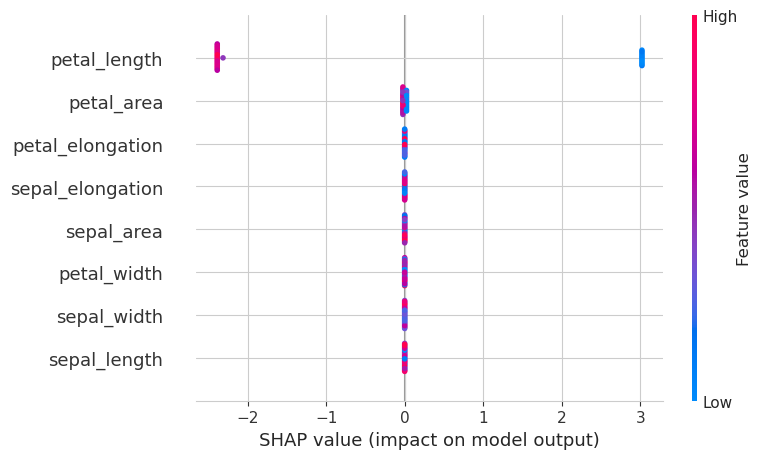

In [73]:
shap.summary_plot(xgbc_shap_values[:,:,0], X_val, title=classes[0])

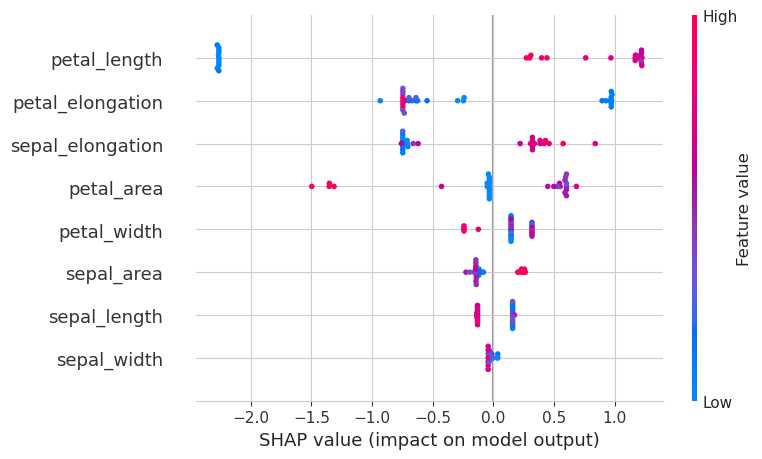

In [74]:
shap.summary_plot(xgbc_shap_values[:,:,1], X_val, title=classes[1])

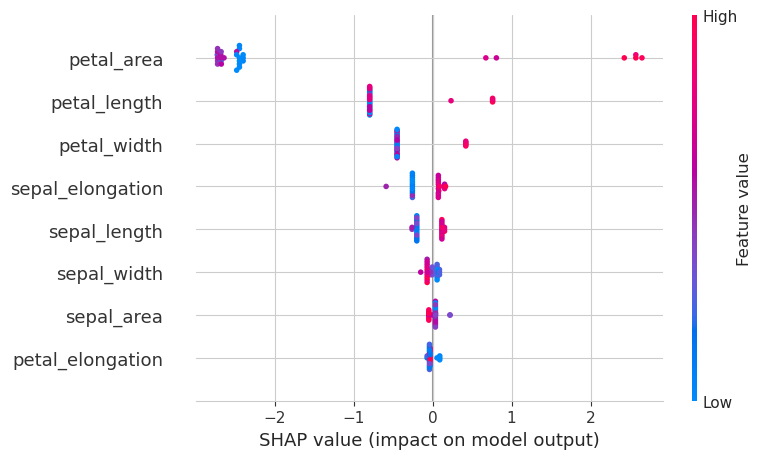

In [75]:
shap.summary_plot(xgbc_shap_values[:,:,2], X_val, title=classes[2])

#### Model 4: `LogisticRegression`

In [76]:
# ?LogisticRegression

In [79]:
def model_log(C=1.):
    return LogisticRegression(random_state=0, C=C, solver='lbfgs')

In [80]:
def get_f1score(Xydata, avg='macro', C=1.):

    X_train, X_val, y_train, y_val = Xydata

    model = model_log(C=C)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [81]:
avg = 'macro' # macro average for F1

C_list = [1.*i for i in range(1,11)]

f1s_list = [get_f1score((X_train_scaled, X_val_scaled, y_train_label, y_val_label), avg=avg, C=C_val) for C_val in C_list] # computing F1

In [82]:
# showing results:
C_f1s = dict(zip(C_list, f1s_list))

for key, val in C_f1s.items():
    print('C =', str(key)+', \t f1 =', val)

C = 1.0, 	 f1 = 0.957351290684624
C = 2.0, 	 f1 = 0.957351290684624
C = 3.0, 	 f1 = 1.0
C = 4.0, 	 f1 = 1.0
C = 5.0, 	 f1 = 1.0
C = 6.0, 	 f1 = 1.0
C = 7.0, 	 f1 = 1.0
C = 8.0, 	 f1 = 1.0
C = 9.0, 	 f1 = 1.0
C = 10.0, 	 f1 = 1.0


We have found the best choice of hyperparameter:

In [83]:
best_C = max(C_f1s, key=C_f1s.get)
best_logreg_model = model_log(best_C)

print("best C =", best_C)

best C = 3.0


Let us compute the F1 scores in more detail:

In [84]:
best_logreg_model.fit(X_train_scaled, y_train_label) # fit the model once more
y_preds = best_logreg_model.predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [85]:
print(permutation_importance(best_logreg_model, X_train_scaled, y_train_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best_logreg_model, X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([ 6.66666667e-03,  2.22044605e-17,  1.61666667e-01,  1.26666667e-01,
       -1.66666667e-03,  5.00000000e-03,  1.31666667e-01,  1.50000000e-02]), 'importances_std': array([0.00333333, 0.01054093, 0.01943651, 0.02068279, 0.00333333,
       0.01      , 0.02603417, 0.0062361 ]), 'importances': array([[ 0.00833333,  0.00833333,  0.00833333,  0.00833333,  0.        ],
       [ 0.01666667, -0.01666667,  0.        ,  0.        ,  0.        ],
       [ 0.16666667,  0.15      ,  0.13333333,  0.16666667,  0.19166667],
       [ 0.14166667,  0.09166667,  0.11666667,  0.15      ,  0.13333333],
       [ 0.        ,  0.        ,  0.        , -0.00833333,  0.        ],
       [ 0.01666667,  0.        ,  0.        , -0.00833333,  0.01666667],
       [ 0.13333333,  0.09166667,  0.11666667,  0.16666667,  0.15      ],
       [ 0.00833333,  0.01666667,  0.025     ,  0.01666667,  0.00833333]])}


{'sepal_length': 0.0,
 'sepal_width': 0.039999999999999994,
 'petal_length': 0.13999999999999996,
 'petal_width': 0.10666666666666665,
 'sepal_area': 0.006666666666666665,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.11999999999999997,
 'petal_elongation': 0.05333333333333332}

Five features are really being used:

In [86]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.039999999999999994,
 'petal_length': 0.13999999999999996,
 'petal_width': 0.10666666666666665,
 'sepal_area': 0.006666666666666665,
 'sepal_elongation': 0.033333333333333326,
 'petal_area': 0.11999999999999997,
 'petal_elongation': 0.05333333333333332}

Let us work the SHAP values:

In [87]:
explainer = shap.LinearExplainer(best_logreg_model, X_train_scaled)
logreg_shap_values = explainer.shap_values(X_val_scaled)

print(logreg_shap_values.shape)

(30, 8, 3)


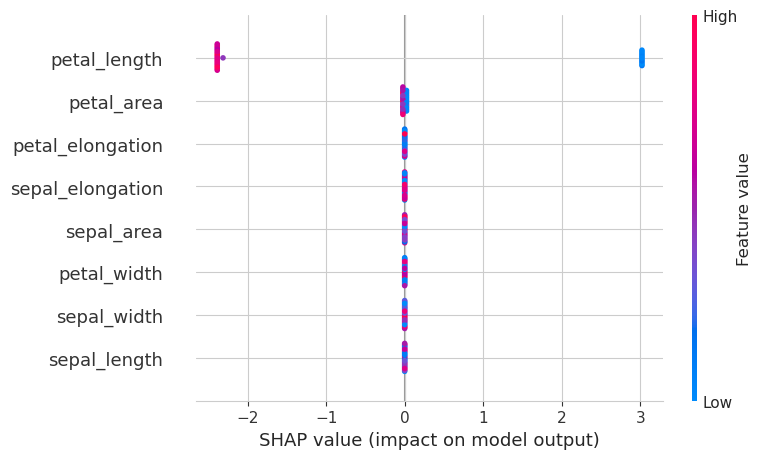

In [88]:
shap.summary_plot(xgbc_shap_values[:,:,0], X_val, title=classes[0], feature_names=X_train.columns)

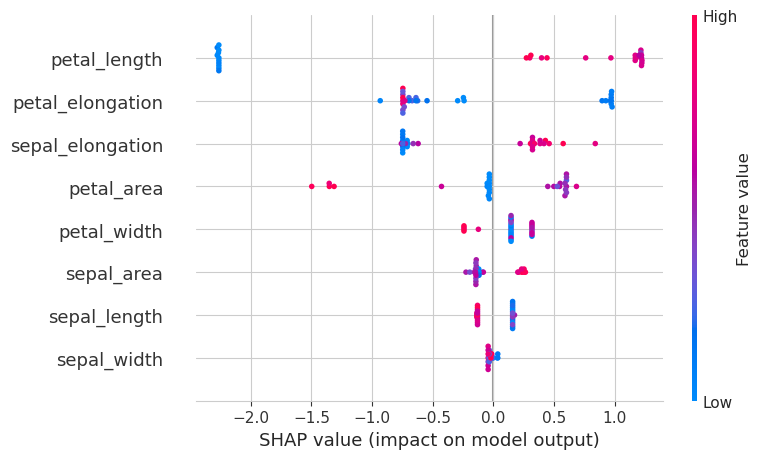

In [89]:
shap.summary_plot(xgbc_shap_values[:,:,1], X_val, title=classes[1], feature_names=X_train.columns)

In [ ]:
shap.summary_plot(xgbc_shap_values[:,:,2], X_val, title=classes[2], feature_names=X_train.columns)

#### Model 5: `KNeighborsClassifier`

In [196]:
# ?KNeighborsClassifier

In [182]:
def model_knn(n_neighbors):
    return KNeighborsClassifier(n_neighbors=n_neighbors, weights='distance')

In [183]:
def get_f1score(Xydata, avg='macro', n_neighbors=3):

    X_train, X_val, y_train, y_val = Xydata

    model = model_knn(n_neighbors=n_neighbors)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [184]:
avg = 'macro' # macro average for F1

nn_list = list(range(3, 11))

f1s_list = [get_f1score((X_train_scaled, X_val_scaled, y_train_label, y_val_label), avg=avg, n_neighbors=nn) for nn in nn_list] # computing F1

In [185]:
# showing results:
nn_f1s = dict(zip(nn_list, f1s_list))

for key, val in nn_f1s.items():
    print('n_neighbors =', str(key)+', \t f1 =', val)

n_neighbors = 3, 	 f1 = 0.957351290684624
n_neighbors = 4, 	 f1 = 0.957351290684624
n_neighbors = 5, 	 f1 = 0.957351290684624
n_neighbors = 6, 	 f1 = 0.957351290684624
n_neighbors = 7, 	 f1 = 0.957351290684624
n_neighbors = 8, 	 f1 = 0.957351290684624
n_neighbors = 9, 	 f1 = 0.957351290684624
n_neighbors = 10, 	 f1 = 0.957351290684624


We have found the best choice of hyperparameter:

In [186]:
best_nn = max(nn_f1s, key=nn_f1s.get)
best_knn_model = model_knn(best_nn)

print("best n_neighbors =", best_nn)

best n_neighbors = 3


Let us compute the F1 scores in more detail:

In [187]:
best_knn_model.fit(X_train_scaled, y_train_label) # fit the model once more
y_preds = best_knn_model.predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [188]:
print(permutation_importance(best_knn_model, X_train_scaled, y_train_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best_knn_model, X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([0.045     , 0.05166667, 0.13666667, 0.125     , 0.03166667,
       0.05833333, 0.13166667, 0.04166667]), 'importances_std': array([0.00849837, 0.02953341, 0.00666667, 0.01394433, 0.01105542,
       0.01666667, 0.01224745, 0.01666667]), 'importances': array([[0.05833333, 0.04166667, 0.03333333, 0.04166667, 0.05      ],
       [0.04166667, 0.10833333, 0.025     , 0.03333333, 0.05      ],
       [0.13333333, 0.14166667, 0.14166667, 0.14166667, 0.125     ],
       [0.10833333, 0.125     , 0.15      , 0.125     , 0.11666667],
       [0.025     , 0.03333333, 0.05      , 0.03333333, 0.01666667],
       [0.03333333, 0.08333333, 0.06666667, 0.05833333, 0.05      ],
       [0.125     , 0.125     , 0.14166667, 0.15      , 0.11666667],
       [0.03333333, 0.06666667, 0.05      , 0.01666667, 0.04166667]])}


{'sepal_length': 0.01333333333333333,
 'sepal_width': 0.019999999999999997,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.059999999999999984,
 'sepal_area': 0.01333333333333333,
 'sepal_elongation': 0.019999999999999997,
 'petal_area': 0.059999999999999984,
 'petal_elongation': 0.06666666666666665}

Five features are really being used:

In [189]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_length': 0.01333333333333333,
 'sepal_width': 0.019999999999999997,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.059999999999999984,
 'sepal_area': 0.01333333333333333,
 'sepal_elongation': 0.019999999999999997,
 'petal_area': 0.059999999999999984,
 'petal_elongation': 0.06666666666666665}

Let us work the SHAP values:

In [192]:
explainer = shap.KernelExplainer(best_knn_model.predict_proba, X_train_scaled)
knn_shap_values = explainer.shap_values(X_val_scaled)

print(knn_shap_values.shape)

Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/30 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.01226573, -0.02599379, -0.06618906, -0.07549806, -0.00057193,
       -0.03207309, -0.07241917, -0.03998916])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.0014408 ,  0.00836014, -0.00849366, -0.07057111,  0.00857433,
       -0.01148337, -0.05149848, -0.18178039])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 0.01370653,  0.01763365,  0.07468273,  0.14606917, -0.0080024 ,
        0.04355646,  0.12391765,  0.22176954])
num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.02480676, -0.06756519, -0.04546709, -0.03220542, -0.00495468,
       -0.09425915, -0.03693817, -0.01880354])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 0.01894032, -0.00993345,  0.090360

(30, 8, 3)


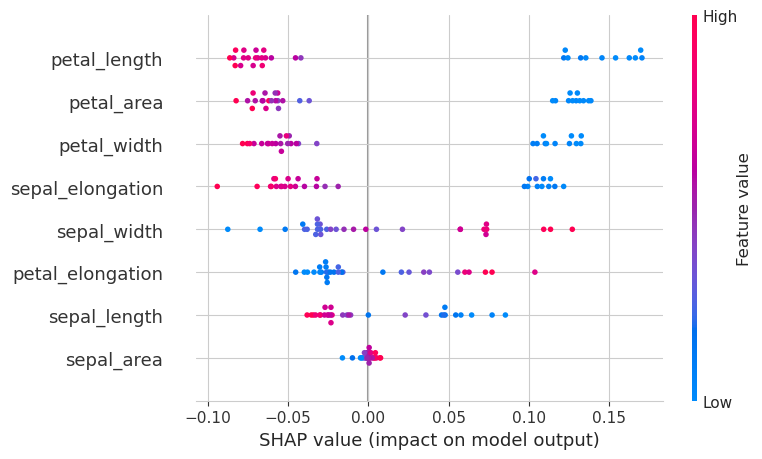

In [193]:
shap.summary_plot(knn_shap_values[:,:,0], X_val, title=classes[0], feature_names=X_train.columns)

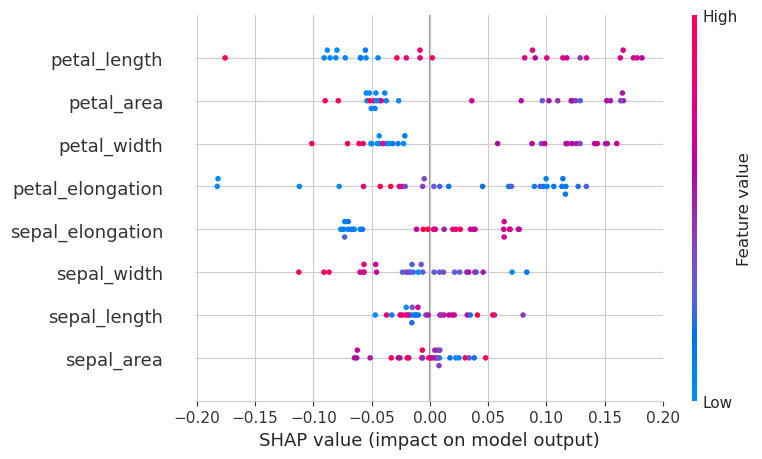

In [194]:
shap.summary_plot(knn_shap_values[:,:,1], X_val, title=classes[1], feature_names=X_train.columns)

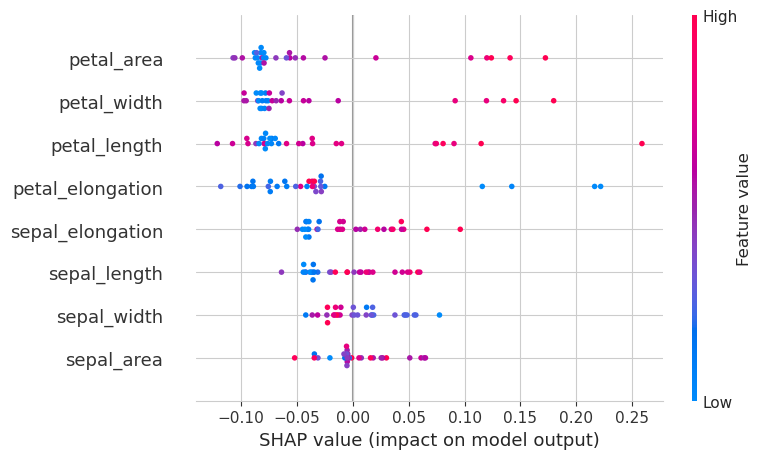

In [195]:
shap.summary_plot(knn_shap_values[:,:,2], X_val, title=classes[2], feature_names=X_train.columns)

#### Model 6: `SVC`

In [226]:
# ?SVC

In [214]:
def model_svc(C=1.):
    return SVC(C=C, kernel='rbf', probability=True, random_state=0)

In [215]:
def get_f1score(Xydata, avg='macro', C=1.):

    X_train, X_val, y_train, y_val = Xydata

    model = model_svc(C=C)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [216]:
avg = 'macro' # macro average for F1

C_list = [0.5*i for i in range(1, 21)]

f1s_list = [get_f1score((X_train_scaled, X_val_scaled, y_train_label, y_val_label), avg=avg, C=c_val) for c_val in C_list] # computing F1

In [217]:
# showing results:
C_f1s = dict(zip(C_list, f1s_list))

for key, val in C_f1s.items():
    print('C =', str(key)+', \t f1 =', val)

C = 0.5, 	 f1 = 0.957351290684624
C = 1.0, 	 f1 = 0.957351290684624
C = 1.5, 	 f1 = 0.957351290684624
C = 2.0, 	 f1 = 0.957351290684624
C = 2.5, 	 f1 = 0.957351290684624
C = 3.0, 	 f1 = 0.957351290684624
C = 3.5, 	 f1 = 0.957351290684624
C = 4.0, 	 f1 = 0.957351290684624
C = 4.5, 	 f1 = 0.957351290684624
C = 5.0, 	 f1 = 0.957351290684624
C = 5.5, 	 f1 = 0.957351290684624
C = 6.0, 	 f1 = 0.957351290684624
C = 6.5, 	 f1 = 0.957351290684624
C = 7.0, 	 f1 = 0.957351290684624
C = 7.5, 	 f1 = 0.957351290684624
C = 8.0, 	 f1 = 0.957351290684624
C = 8.5, 	 f1 = 0.957351290684624
C = 9.0, 	 f1 = 0.957351290684624
C = 9.5, 	 f1 = 0.957351290684624
C = 10.0, 	 f1 = 0.957351290684624


We have found the best choice of hyperparameter:

In [218]:
best_C = max(C_f1s, key=C_f1s.get)
best_svc_model = model_svc(best_C)

print("best C =", best_C)

best C = 0.5


Let us compute the F1 scores in more detail:

In [219]:
best_svc_model.fit(X_train_scaled, y_train_label) # fit the model once more
y_preds = best_knn_model.predict(X_val_scaled) # compute predictions

for species, f1 in zip(classes, f1_score(y_val_label, y_preds, average=None)):
    print(species+" f1 score:\t", f1) # compute F1 for each class

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val_label, y_preds, average=avg)) # compute F1 for each different kind of average

setosa f1 score:	 1.0
versicolor f1 score:	 0.9629629629629629
virginica f1 score:	 0.9090909090909091
**************************************************
micro: 0.9666666666666667
macro: 0.957351290684624
weighted: 0.9657687991021324


Let us consider now the permutation importance of the features used, to gain insight into what is being done by the tree:

In [220]:
print(permutation_importance(best_svc_model, X_train_scaled, y_train_label))
feat_import = dict(zip(X_val.columns, permutation_importance(best_svc_model, X_val_scaled, y_val_label, random_state=0)['importances_mean']))
feat_import

{'importances_mean': array([-4.44089210e-17, -5.00000000e-03,  1.05000000e-01,  1.08333333e-01,
       -3.33333333e-03, -1.66666667e-03,  1.11666667e-01,  4.83333333e-02]), 'importances_std': array([0.00745356, 0.00666667, 0.02333333, 0.02415229, 0.00666667,
       0.00816497, 0.02392117, 0.01105542]), 'importances': array([[ 0.00833333, -0.00833333,  0.00833333, -0.00833333,  0.        ],
       [ 0.        , -0.00833333,  0.        , -0.01666667,  0.        ],
       [ 0.08333333,  0.09166667,  0.1       ,  0.1       ,  0.15      ],
       [ 0.1       ,  0.10833333,  0.075     ,  0.10833333,  0.15      ],
       [ 0.        , -0.00833333, -0.00833333, -0.00833333,  0.00833333],
       [ 0.        ,  0.00833333,  0.        , -0.01666667,  0.        ],
       [ 0.09166667,  0.10833333,  0.08333333,  0.125     ,  0.15      ],
       [ 0.03333333,  0.04166667,  0.05      ,  0.05      ,  0.06666667]])}


{'sepal_length': 0.0,
 'sepal_width': 0.01333333333333333,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.046666666666666655,
 'sepal_area': 0.0,
 'sepal_elongation': 0.01333333333333333,
 'petal_area': 0.046666666666666655,
 'petal_elongation': 0.05333333333333332}

Five features are really being used:

In [221]:
{key:val for key, val in feat_import.items() if val > 0}

{'sepal_width': 0.01333333333333333,
 'petal_length': 0.059999999999999984,
 'petal_width': 0.046666666666666655,
 'sepal_elongation': 0.01333333333333333,
 'petal_area': 0.046666666666666655,
 'petal_elongation': 0.05333333333333332}

Let us work the SHAP values:

In [222]:
explainer = shap.KernelExplainer(best_svc_model.predict_proba, X_train_scaled)
knn_shap_values = explainer.shap_values(X_val_scaled)

print(knn_shap_values.shape)

Using 120 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/30 [00:00<?, ?it/s]

num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.01509485, -0.02309669, -0.05761933, -0.07010251, -0.00077192,
       -0.03235288, -0.06696963, -0.03435762])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([ 0.01216105,  0.00174563, -0.01488923, -0.08491637, -0.00581886,
        0.01576644, -0.05682993, -0.1613051 ])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([0.0029338 , 0.02135106, 0.07250855, 0.15501888, 0.00659077,
       0.01658644, 0.12379955, 0.19566272])
num_full_subsets = 4
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([-0.02321688, -0.07221902, -0.03771983, -0.02451349, -0.01157898,
       -0.09516883, -0.02939739, -0.00718227])
np.sum(w_aug) = 8.000000000000002
np.sum(self.kernelWeights) = 0.9999999999999996
phi = array([0.03654216, 0.06947452, 0.09961728, 0.11343

(30, 8, 3)


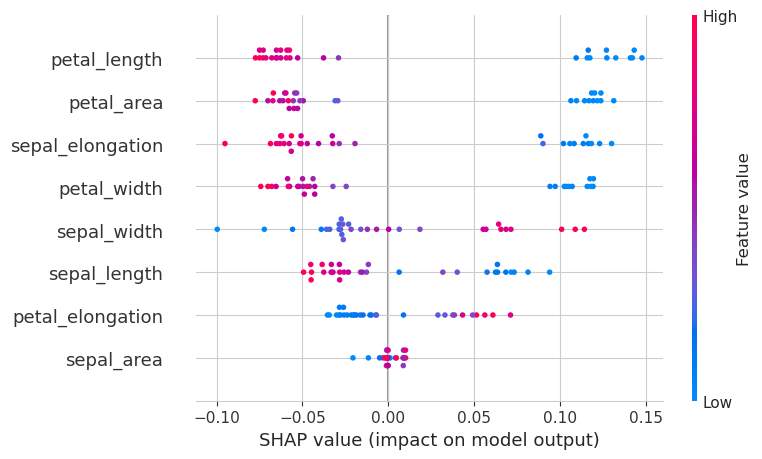

In [223]:
shap.summary_plot(knn_shap_values[:,:,0], X_val, title=classes[0], feature_names=X_train.columns)

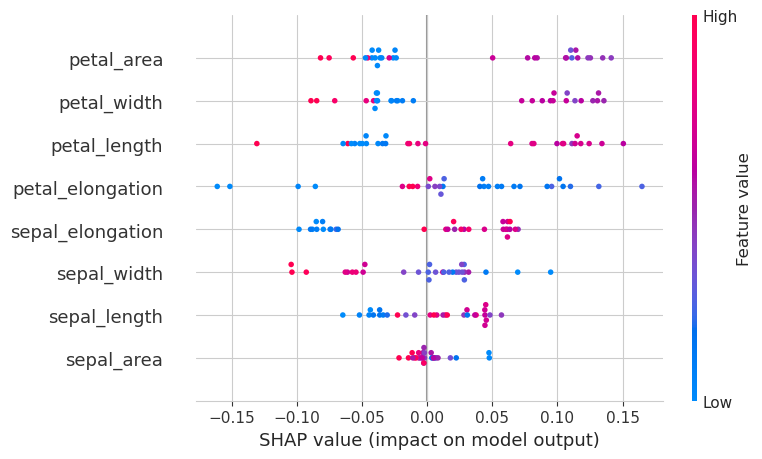

In [224]:
shap.summary_plot(knn_shap_values[:,:,1], X_val, title=classes[1], feature_names=X_train.columns)

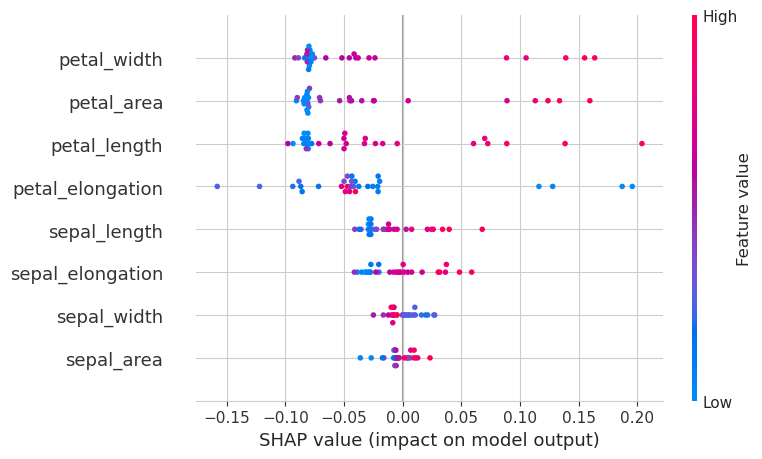

In [225]:
shap.summary_plot(knn_shap_values[:,:,2], X_val, title=classes[2], feature_names=X_train.columns)

## 7. Exporting Best Model

In [395]:
import pickle

In [377]:
models = ['dtc', 'rfc', 'xbgc', 'logreg', 'knn', 'svc']

Let us review the best scores:

In [390]:
val_score

{'dtc': 1.0,
 'rfc': 1.0,
 'xgbc': 1.0,
 'logreg': 0.957351290684624,
 'knn': 0.957351290684624,
 'svc': 0.957351290684624}

It is evident that `dtc`, `rfc`, and `xgbc` performed the best. Which one to pick? Well, let's look at their mean CV test scores, and their standard deviations:

In [397]:
stds = {}
for model in ['dtc', 'rfc', 'xgbc']:
    print(model)
    idx_largest_score = grid[model].cv_results_['mean_test_score'].argmax()
    print("found best score?", grid[model].cv_results_['mean_test_score'][idx_largest_score] == best['score'][model])
    print("best score:", best['score'][model], "+-", grid[model].cv_results_['std_test_score'][idx_largest_score], "\n")

    stds[model] = grid[model].cv_results_['std_test_score'][idx_largest_score]

dtc
found best score? True
best score: 0.9500731403672582 +- 0.030405697137195813 

rfc
found best score? True
best score: 0.9422953625894802 +- 0.032881601436071654 

xgbc
found best score? True
best score: 0.9415462424285955 +- 0.019098092242766804 



Since their best mean CV scores are all within each others standard deviations, they are all functionally equivalent in the CV. Thus, what matters is precisely the standard deviation, which is evidence of their stability. Evidently, the one that is the most stable (smallest standard deviation) is `xgbc`. So we will pick that one.

In [399]:
overall_best_model = min(stds, key=stds.get)
print(overall_best_model)

xgbc


In [400]:
best['model'][overall_best_model]

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.03, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1700,
              n_jobs=None, num_parallel_tree=None, ...)

To save it, we pickle it:

In [ ]:
model_path = "./models/"+overall_best_model+".pkl"

In [406]:
# with open(model_path, "wb") as f:
#     pickle.dump(best['model'][overall_best_model], f)

To load the model, run the cell below:

In [409]:
# with open(model_path, "rb") as f:
#     my_best_model = pickle.load(f)

# my_best_model